In [1]:
getwd()

setwd("../")

source("base/it-402-dc-data_initial_exploration-base.r")
source("base/common_interaction.r")


source("base/sta_it_402_dc_data_etl.r")
source("base/sta_it_402_dc_data_parsing.r")   


setwd("teacher_demographics/")
getwd()

#library(tidyverse)
library(readxl)

#library(khroma)
library(RColorBrewer)

#library(lubridate)

[1] "/Users/aba-sah/OneDrive/work/programming/devt/r/work/sta/it-402-dc/teacher_demographics"

── Attaching packages ───────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.5     ✔ purrr   0.3.4
✔ tibble  3.1.5     ✔ dplyr   1.0.7
✔ tidyr   1.1.4     ✔ stringr 1.4.0
✔ readr   2.0.2     ✔ forcats 0.5.1

── Conflicts ──────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


Attaching package: ‘scales’


The following object is masked from ‘package:purrr’:

    discard


The following object is masked from ‘package:readr’:

    col_factor



Attaching package: ‘lubridate’


The following objects are masked from ‘package:base’:

    date, intersect, setdiff, union



Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout


Warning message in mask$eval_all_mutate(quo):
“NAs introduced by coercion

[1] "/Users/aba-sah/OneDrive/work/programming/devt/r/work/sta/it-402-dc/teacher_demographics"

### <span style = "color:maroon">Teacher Censuses &mdash; 2010&ndash;2021</span>

* Teacher headcount by gender and local authority &ndash; Table 8.6
* Main subject by local authority &ndash; Table 8.9
* Main subject by local authority &amp; gender &ndash; Table 3.9 :: skip 2|3
* Main subject by local authority &amp; age &ndash; Table 3.10 (from  :: skip 1|2

* Local Authority by Age &ndash; Table 8.3 :: skip 1|2
* Local Authority by Gender &ndash; Table 8.1 :: skip 2|3

In [2]:
teacher_census_datafiles <- list.files("../sta_it_402/data/demographic_data/teacher_censuses", pattern = "teacher_census_", full.names = T, ignore.case = T)
teacher_census_datafiles

sel_idx <- str_detect(teacher_census_datafiles, "\\/\\~")
teacher_census_datafiles <- teacher_census_datafiles[!sel_idx]

sel_idx <- str_detect(teacher_census_datafiles, "2010|2011")
teacher_census_datafiles[!sel_idx]

[1] "../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2010.xls"                          
 [2] "../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2011.xls"                          
 [3] "../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2012.xls"                          
 [4] "../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2013.xls"                          
 [5] "../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2014.xls"                          
 [6] "../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2015.xls"                          
 [7] "../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2016.xls"                          
 [8] "../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2017.xlsx"                         
 [9] "../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2018.xlsx"                         
[10] "../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_2020_3.xlsx"                       
[11] "../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_Supplementary_Statistics_2021.xlsx"
[12] "../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_Supplmentary_Tables_2019.xlsx"

[1] "../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2012.xls"                          
 [2] "../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2013.xls"                          
 [3] "../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2014.xls"                          
 [4] "../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2015.xls"                          
 [5] "../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2016.xls"                          
 [6] "../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2017.xlsx"                         
 [7] "../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2018.xlsx"                         
 [8] "../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_2020_3.xlsx"                       
 [9] "../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_Supplementary_Statistics_2021.xlsx"
[10] "../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_Supplmentary_Tables_2019.xlsx"

In [3]:
teacher_census <- data.frame()
glimpse(teacher_census)


for (i in seq_along(teacher_census_datafiles[sel_idx])) {

    print(paste("Parsing file: ", teacher_census_datafiles[sel_idx][[i]], " ..."))

    teacher_census <- teacher_census %>%
        bind_rows(read_excel(teacher_census_datafiles[sel_idx][[i]],
                           sheet = "Table 8.9", col_types =  "text", trim_ws = T, skip = 1) %>%

                    filter(rowSums(is.na(.)) != ncol(.)) %>%
                    rename_with(~ c("LocalAuthority"), matches("^...1$")) %>%
                    select(- matches("^\\.+\\d+")) %>%

                    mutate(across(!LocalAuthority, ~ if_else((. == "-"), "0", .)),
                           Year = str_match(teacher_census_datafiles[sel_idx][[i]], "\\d{4}")[, 1]) %>%
                    relocate(Year, everything())
                  ) 
    
    teacher_census %>%
        nrow() %>%
        print()
}


for (i in seq_along(teacher_census_datafiles[!sel_idx])) {

    print(paste("Parsing file: ", teacher_census_datafiles[!sel_idx][[i]], " ..."))

    teacher_census <- teacher_census %>%
        bind_rows(read_excel(teacher_census_datafiles[!sel_idx][[i]],
                           sheet = "Table 8.9", col_types =  "text", trim_ws = T, skip = 2) %>%

                    filter(rowSums(is.na(.)) != ncol(.)) %>%
                    rename_with(~ c("LocalAuthority"), matches("^...1$")) %>%
                    select(- matches("^\\.+\\d+")) %>%

                    mutate(across(!LocalAuthority, ~ if_else((. == "-"), "0", .)),
                           Year = str_match(teacher_census_datafiles[!sel_idx][[i]], "\\d{4}")[, 1]) %>%
                    relocate(Year, everything())
                  ) 
    
    teacher_census %>%
        nrow() %>%
        print()

}

teacher_census %>%
    glimpse()




Rows: 0
Columns: 0
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2010.xls  ..."


New names:
* `` -> ...1
* `` -> ...40



[1] 36
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2011.xls  ..."


New names:
* `` -> ...1



[1] 71
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2012.xls  ..."


New names:
* `` -> ...1



[1] 106
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2013.xls  ..."


New names:
* `` -> ...1



[1] 141
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2014.xls  ..."


New names:
* `` -> ...1



[1] 177
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2015.xls  ..."


New names:
* `` -> ...1



[1] 212
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2016.xls  ..."


New names:
* `` -> ...1



[1] 247
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2017.xlsx  ..."


New names:
* `` -> ...1



[1] 282
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2018.xlsx  ..."


New names:
* `` -> ...1
* `` -> ...40



[1] 317
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_2020_3.xlsx  ..."


New names:
* `` -> ...1
* `` -> ...41



[1] 353
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_Supplementary_Statistics_2021.xlsx  ..."


New names:
* `` -> ...1
* `` -> ...41



[1] 389
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_Supplmentary_Tables_2019.xlsx  ..."


New names:
* `` -> ...1
* `` -> ...40



[1] 425
Rows: 425
Columns: 43
$ Year                                <chr> "2010", "2010", "2010", "2010", "2…
$ LocalAuthority                      <chr> "Aberdeen City", "Aberdeenshire", …
$ English                             <chr> "69", "126", "68", "48", "23", "90…
$ French                              <chr> "27", "55", "26", "21", "7", "38",…
$ German                              <chr> "8", "15", "5", "2", "4", "5", "1"…
$ Spanish                             <chr> "2", "2", "0", "0", "0", "0", "3",…
$ Gaelic                              <chr> "1", "0", "0", "8", "0", "0", "0",…
$ Italian                             <chr> "0", "0", "0", "0", "0", "0", "0",…
$ `English as an Additional Language` <chr> "0", "0", "0", "0", "0", "2", "2",…
$ `Community Languages`               <chr> "0", "0", "0", "0", "0", "0", "0",…
$ `Other Modern Languages`            <chr> "0", "2", "6", "2", "0", "3", "18"…
$ Classics                            <chr> "0", "0", "0", "0", "0", "0", "2",…
$ Mathemat

In [4]:
teacher_census %>%
    rename_with(~ snakecase::to_upper_camel_case(.)) %>%
    #filter(if_any(!LocalAuthority, ~ !is.na(.) & is.na(as.integer(.))))
    filter(!if_all(!c(Year, LocalAuthority), is.na)) %>%
    distinct(LocalAuthority) %>%
    arrange(LocalAuthority)


teacher_census %>%
    rename_with(~ snakecase::to_upper_camel_case(.)) %>%

    rowwise() %>%
    #filter(sum(is.na(c_across(matches("OtherModernLanguages")))) != 1) 
    filter(sum(is.na(c_across(matches("Other") & !matches("OtherModernLanguages")))) != 1) 
    #filter(if_any(matches("OtherModernLanguages"), is.na) & !if_all(matches("OtherModernLanguages"), is.na)) %>%


LocalAuthority
<chr>
Aberdeen City
Aberdeenshire
All local authorities
Angus
Argyll & Bute
Argyll and Bute
City of Edinburgh
Clackmannanshire
Dumfries & Galloway


Year,LocalAuthority,English,French,German,Spanish,Gaelic,Italian,EnglishAsAnAdditionalLanguage,CommunityLanguages,⋯,AsnGeneral,AsnBehaviouralSupport,AsnLearningDifficulties,AsnPhysicalDisabilities,HearingImpairment,VisualImpairment,Other,OtherNotKnown,OtherModernLanguages2,NotKnown
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
2010,(1) excludes head teachers and depute head teachers.,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2010,(2) Amended January 2016.,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2011,(1) excludes head teachers and depute head teachers.,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2012,(1) excludes head teachers and depute head teachers.,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2013,(1) excludes head teachers and depute head teachers.,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2014,(1) Excludes head teachers and depute head teachers.,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2014,(2) 2014 Teacher figures were corrected in February and December 2015.,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2015,(1) Excludes head teachers and depute head teachers.,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2016,(1) Excludes head teachers and depute head teachers.,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [5]:
teacher_census <- teacher_census %>%

    rename_with(~ snakecase::to_upper_camel_case(gsub("\\&", "and", .), abbreviations = c("ASN", "PSE"))) %>%
    filter(!if_all(!c(Year, LocalAuthority), is.na) &
           (LocalAuthority != "All local authorities")
          ) %>%

    mutate(across(where(is.character), ~ str_squish(.)),
           across(Year, as.ordered),
           across(where(is.character) & !LocalAuthority, as.numeric),   
           across(OtherModernLanguages, ~ coalesce(., OtherModernLanguages2)),
           across(Other, ~ coalesce(., OtherNotKnown)),
          ) %>%
           
    select(- c(OtherModernLanguages2, OtherNotKnown)) %>%

    pivot_longer(!c(Year, LocalAuthority), names_to = "Subject", values_to = "TeacherFTE") %>%
    mutate(across(c(LocalAuthority, Subject), as.factor)) 

teacher_census %>%
    glimpse()

Rows: 15,444
Columns: 4
$ Year           <ord> 2010, 2010, 2010, 2010, 2010, 2010, 2010, 2010, 2010, 2…
$ LocalAuthority <fct> "Aberdeen City", "Aberdeen City", "Aberdeen City", "Abe…
$ Subject        <fct> English, French, German, Spanish, Gaelic, Italian, Engl…
$ TeacherFTE     <dbl> 69, 27, 8, 2, 1, 0, 0, 0, 0, 0, 71, 31, 25, 1, 31, 0, 2…


In [6]:
levels(teacher_census$Year)
levels(teacher_census$LocalAuthority)
levels(teacher_census$Subject)

[1] "2010" "2011" "2012" "2013" "2014" "2015" "2016" "2017" "2018" "2019"
[11] "2020" "2021"

[1] "Aberdeen City"         "Aberdeenshire"         "Angus"                
 [4] "Argyll & Bute"         "Argyll and Bute"       "City of Edinburgh"    
 [7] "Clackmannanshire"      "Dumfries & Galloway"   "Dumfries and Galloway"
[10] "Dundee City"           "East Ayrshire"         "East Dunbartonshire"  
[13] "East Lothian"          "East Renfrewshire"     "Edinburgh, City of"   
[16] "Eilean Siar"           "Falkirk"               "Fife"                 
[19] "Glasgow City"          "Grant aided"           "Grant Aided"          
[22] "Highland"              "Inverclyde"            "Midlothian"           
[25] "Moray"                 "Na h-Eileanan Siar"    "North Ayrshire"       
[28] "North Lanarkshire"     "Orkney Islands"        "Perth & Kinross"      
[31] "Perth and Kinross"     "Renfrewshire"          "Scottish Borders"     
[34] "Shetland Islands"      "South Ayrshire"        "South Lanarkshire"    
[37] "Stirling"              "West Dunbartonshire"   "West Lothian"

[1] "ArtAndDesign"                  "ASNBehaviouralSupport"        
 [3] "ASNGeneral"                    "ASNLearningDifficulties"      
 [5] "ASNPhysicalDisabilities"       "Biology"                      
 [7] "BusinessEducation"             "Chemistry"                    
 [9] "Classics"                      "CommunityLanguages"           
[11] "Computing"                     "Drama"                        
[13] "Economics"                     "English"                      
[15] "EnglishAsAnAdditionalLanguage" "French"                       
[17] "Gaelic"                        "Geography"                    
[19] "German"                        "HearingImpairment"            
[21] "History"                       "HomeEconomics"                
[23] "Italian"                       "LearningSupport"              
[25] "Mathematics"                   "MediaStudies"                 
[27] "ModernStudies"                 "Music"                        
[29] "NotKnown"                      "Other"                        
[31] "OtherModernLanguages"          "PhysicalEducation"            
[33] "Physics"                       "PSEGuidance"                  
[35] "ReligiousEducation"            "ScienceGeneral"               
[37] "Spanish"                       "TechnicalEducation"           
[39] "VisualImpairment"

In [7]:
teacher_census <- teacher_census %>%
    mutate(across(Subject, ~ fct_inorder(.)),
           across(Subject, ~ fct_relevel(., "Computing"))
          )

levels(teacher_census$Subject)

[1] "Computing"                     "English"                      
 [3] "French"                        "German"                       
 [5] "Spanish"                       "Gaelic"                       
 [7] "Italian"                       "EnglishAsAnAdditionalLanguage"
 [9] "CommunityLanguages"            "OtherModernLanguages"         
[11] "Classics"                      "Mathematics"                  
[13] "Biology"                       "Chemistry"                    
[15] "ScienceGeneral"                "Physics"                      
[17] "Economics"                     "Geography"                    
[19] "History"                       "ReligiousEducation"           
[21] "ModernStudies"                 "MediaStudies"                 
[23] "BusinessEducation"             "HomeEconomics"                
[25] "TechnicalEducation"            "PSEGuidance"                  
[27] "ArtAndDesign"                  "Music"                        
[29] "PhysicalEducation"             "Drama"                        
[31] "LearningSupport"               "ASNGeneral"                   
[33] "ASNBehaviouralSupport"         "ASNLearningDifficulties"      
[35] "ASNPhysicalDisabilities"       "HearingImpairment"            
[37] "VisualImpairment"              "Other"                        
[39] "NotKnown"

In [8]:
 teacher_census %>%
    distinct(LocalAuthority) %>%
    arrange(LocalAuthority)

LocalAuthority
<fct>
Aberdeen City
Aberdeenshire
Angus
Argyll & Bute
Argyll and Bute
City of Edinburgh
Clackmannanshire
Dumfries & Galloway
Dumfries and Galloway


In [9]:
teacher_census <- teacher_census %>%
    mutate(across(LocalAuthority, as.character),
           across(LocalAuthority, ~ case_when(str_detect(., "Edinburgh") ~ "City of Edinburgh", 
                                              str_detect(., "Eilean") ~ "Na h-Eileanan Siar",
                                              str_detect(., regex("grant aided", ignore_case = TRUE)) ~ "Grant Aided",
                                              TRUE ~ .
                                             )),

           across(LocalAuthority, ~ gsub("\\band\\b", "\\&", .)),
           across(LocalAuthority, as.factor),
           across(LocalAuthority, ~ fct_relevel(., "Grant Aided", after = Inf))
          ) 

levels(teacher_census$LocalAuthority)
length(levels(teacher_census$LocalAuthority))

[1] "Aberdeen City"       "Aberdeenshire"       "Angus"              
 [4] "Argyll & Bute"       "City of Edinburgh"   "Clackmannanshire"   
 [7] "Dumfries & Galloway" "Dundee City"         "East Ayrshire"      
[10] "East Dunbartonshire" "East Lothian"        "East Renfrewshire"  
[13] "Falkirk"             "Fife"                "Glasgow City"       
[16] "Highland"            "Inverclyde"          "Midlothian"         
[19] "Moray"               "Na h-Eileanan Siar"  "North Ayrshire"     
[22] "North Lanarkshire"   "Orkney Islands"      "Perth & Kinross"    
[25] "Renfrewshire"        "Scottish Borders"    "Shetland Islands"   
[28] "South Ayrshire"      "South Lanarkshire"   "Stirling"           
[31] "West Dunbartonshire" "West Lothian"        "Grant Aided"

[1] 33

In [10]:
glimpse(teacher_census)

Rows: 15,444
Columns: 4
$ Year           <ord> 2010, 2010, 2010, 2010, 2010, 2010, 2010, 2010, 2010, 2…
$ LocalAuthority <fct> Aberdeen City, Aberdeen City, Aberdeen City, Aberdeen C…
$ Subject        <fct> English, French, German, Spanish, Gaelic, Italian, Engl…
$ TeacherFTE     <dbl> 69, 27, 8, 2, 1, 0, 0, 0, 0, 0, 71, 31, 25, 1, 31, 0, 2…


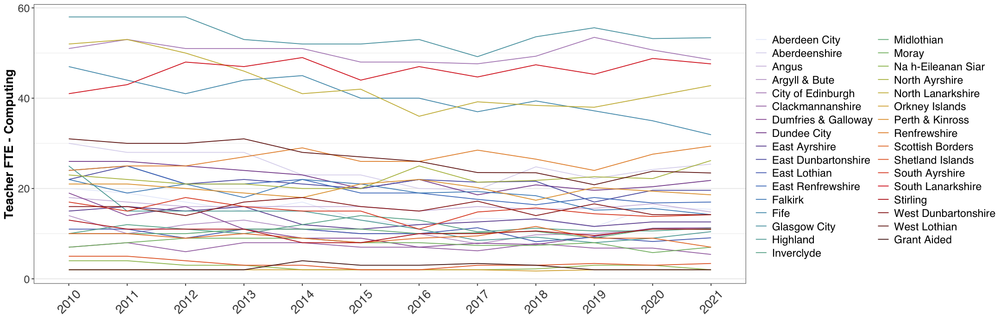

In [11]:
options(repr.plot.width = 18, repr.plot.height = 6)

teacher_census %>%
    filter(Subject == "Computing") %>%
    
    ggplot(aes(Year, TeacherFTE, colour = LocalAuthority, group = LocalAuthority)) +
        geom_line() + 
        ylab("Teacher FTE - Computing") +
        xlab("") + 
        dressCodeTheme +
        khroma::scale_colour_smoothrainbow(discrete = TRUE) +
        theme(#legend.position = "bottom", 
              legend.title = element_blank(), 
              legend.margin = margin(0),
              axis.text.y = element_text(size = 14), # element_markdown
              axis.text.x = element_text(size = 16, angle = 45, vjust = 0.5),
              ) 


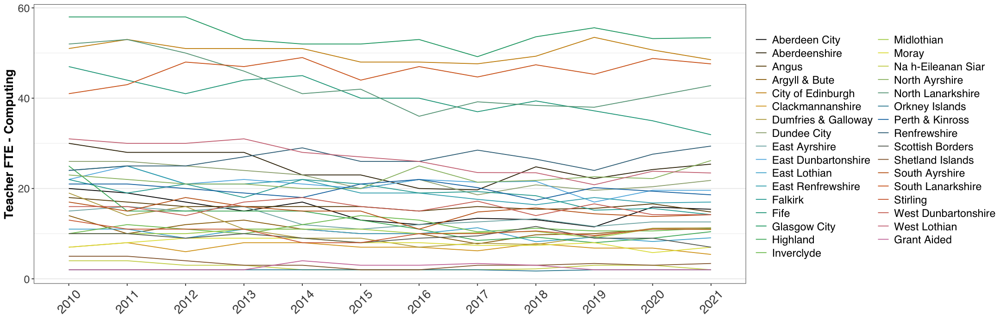

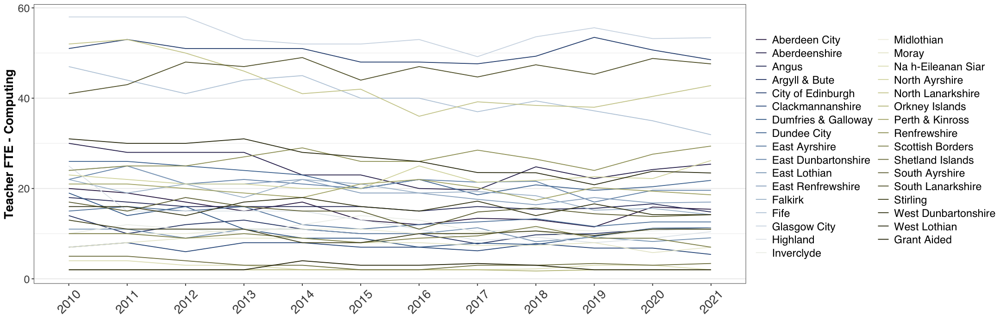

In [12]:


teacher_census %>%
    filter(Subject == "Computing") %>%
    
    ggplot(aes(Year, TeacherFTE, colour = LocalAuthority, group = LocalAuthority)) +
        geom_line() + 
        ylab("Teacher FTE - Computing") +
        xlab("") + 
        dressCodeTheme +
        scale_colour_manual(values = colorRampPalette(colour("okabe ito")(8))(33)) +
        theme(#legend.position = "bottom", 
              legend.title = element_blank(), 
              legend.margin = margin(0),
              axis.text.y = element_text(size = 14), # element_markdown
              axis.text.x = element_text(size = 16, angle = 45, vjust = 0.5),
              ) 


teacher_census %>%
    filter(Subject == "Computing") %>%
    
    ggplot(aes(Year, TeacherFTE, colour = LocalAuthority, group = LocalAuthority)) +
        geom_line() + 
        ylab("Teacher FTE - Computing") +
        xlab("") + 
        dressCodeTheme +
        scale_colour_manual(values = colorRampPalette(colour("broc")(48))(33)) +
        theme(#legend.position = "bottom", 
              legend.title = element_blank(), 
              legend.margin = margin(0),
              axis.text.y = element_text(size = 14), # element_markdown
              axis.text.x = element_text(size = 16, angle = 45, vjust = 0.5),
              ) 



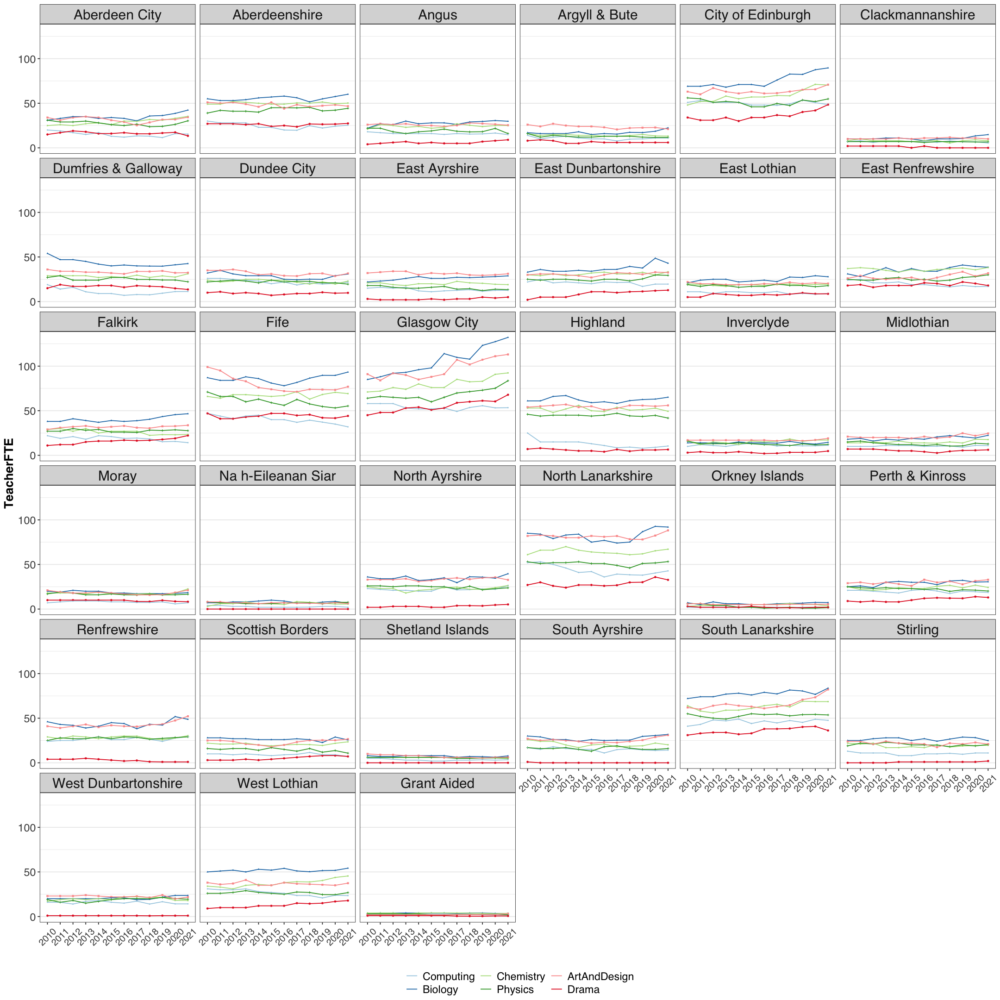

In [13]:
options(repr.plot.width = 18, repr.plot.height = 18)

teacher_census %>%
    filter(Subject %in% c("Computing", "Physics", "Chemistry", "Biology", "ArtAndDesign", "Drama")) %>%
    
    ggplot(aes(Year, TeacherFTE, colour = Subject, group = Subject, shape = Subject)) +
        geom_point(size = 0.5, show.legend = FALSE) +
        geom_line() + 
        xlab("") + 
        dressCodeTheme +
        #khroma::scale_colour_romaO(discrete = TRUE, 
        #                           breaks = teacher_census$Subject[1], 
        #                           labels = "Subject") + 
        scale_colour_brewer("subject", palette = "Paired") + #, direction = -1) +
        theme(legend.position = "bottom", 
              legend.title = element_blank(), 
              legend.margin = margin(0),
              axis.text.y = element_text(size = 14), # element_markdown
              axis.text.x = element_text(size = 12, angle = 45, vjust = 0.5),
              ) +
        facet_wrap(~ LocalAuthority)

In [14]:
glimpse(select_focus_subjects)

select_focus_subjects %>%
    filter(SubjectGroup == "Computing")

select_focus_subjects %>%
    filter(SubjectGroup == "HealthAndWellBeing")

select_focus_subjects %>%
    filter(str_detect(SubjectGroup, regex("Technolog", ignore_case = TRUE)))


select_focus_subjects %>%
    filter(SubjectGroup == "ReligiousAndMoralEducation")



levels(select_focus_subjects$SubjectGroup)

Rows: 220
Columns: 3
$ Subject            <fct> "English", "English - Alternative Communication", "…
$ SubjectGroup       <fct> English, English, English, English, English, Maths,…
$ CommonSubjectLabel <fct> English, English, English, English, English, Math, …


Subject,SubjectGroup,CommonSubjectLabel
<fct>,<fct>,<fct>
Computer Arts and Animation,Computing,NA
Computer Games Development,Computing,NA
Computer Games: Creative Development,Computing,NA
Computer Games: Software Development,Computing,NA
Computer Networks and Systems,Computing,NA
Computer Refurbishment,Computing,NA
Computers and Digital Photography,Computing,NA
Computing,Computing,NA
Computing (New),Computing,NA


Subject,SubjectGroup,CommonSubjectLabel
<fct>,<fct>,<fct>
Health and Food Technology,HealthAndWellBeing,NA
Home Economics - Health and Food Technology,HealthAndWellBeing,NA
Home Economics: Health and Food Technology,HealthAndWellBeing,NA
Physical Education,HealthAndWellBeing,NA


Subject,SubjectGroup,CommonSubjectLabel
<fct>,<fct>,<fct>
Biotechnology,Biotechnology,NA
Technological Studies,Technological Studies,NA
Fashion and Textile Technology,Technology,NA
Home Economics,Technology,NA
Home Economics - Fashion and Textile Technology,Technology,NA
Home Economics - Lifestyle and Consumer Technology,Technology,NA
Home Economics (Fabric & Fashion),Technology,NA
Home Economics (Fabrics and Fashion),Technology,NA
Home Economics (Food & Nutrition),Technology,NA


Subject,SubjectGroup,CommonSubjectLabel
<fct>,<fct>,<fct>
Philosophy,ReligiousAndMoralEducation,NA
Religious Studies,ReligiousAndMoralEducation,NA
Religious Studies (Revised),ReligiousAndMoralEducation,NA
Religious Studies (Unrevised),ReligiousAndMoralEducation,NA
"Religious, Moral and Philosophical Studies",ReligiousAndMoralEducation,NA
"Religious, Moral and Philosophical Studies (New)",ReligiousAndMoralEducation,NA


[1] "Computing"                  "OtherComputing"            
 [3] "Biotechnology"              "Engineering"               
 [5] "English"                    "ExpressiveArt"             
 [7] "HealthAndWellBeing"         "Maths"                     
 [9] "ModernLanguages"            "ModernStudies"             
[11] "ReligiousAndMoralEducation" "Sciences"                  
[13] "Technological Studies"      "Technology"

In [57]:
teacher_census <- teacher_census %>%

    mutate(across(Subject, ~ fct_inorder(.)),
           across(SubjectGroup, ~ fct_relevel(., sort(levels(teacher_census$SubjectGroup)[str_detect(levels(teacher_census$SubjectGroup),
                                                      regex("computing", ignore_case = TRUE))])))
          )


levels(teacher_census$SubjectGroup)


[1] "Computing"                  "ASN"                       
 [3] "English"                    "ExpressiveArt"             
 [5] "HealthAndWellBeing"         "Maths"                     
 [7] "ModernLanguages"            "ModernStudies"             
 [9] "OtherEnglish"               "ReligiousAndMoralEducation"
[11] "Sciences"

In [15]:
teacher_census <- teacher_census %>%

    left_join(select_focus_subjects %>%
                 mutate(across(c(Subject, SubjectGroup), as.character),
                        across(Subject, ~ snakecase::to_upper_camel_case(.)))
              ) %>%
    relocate(matches("subject\\w+$"), .after = Subject) %>%
    mutate(across(SubjectGroup, ~ case_when(str_detect(Subject, "English\\w+(Additional|Other)Language") ~ "OtherEnglish",
                                            str_detect(Subject, "English") ~ "English",
                                            Subject %in% c("OtherModernLanguages", "CommunityLanguages") ~ "ModernLanguages",
                                            str_detect(Subject, "Drama") ~ "ExpressiveArt",
                                            str_detect(Subject, "ScienceGeneral|GeneralScience") ~ "Sciences",
                                            Subject %in% c("ReligiousEducation") ~ "ReligiousAndMoralEducation",
                                            Subject %in% c("HomeEconomics") ~ "HealthAndWellBeing",
                                            (Subject %in% c("LearningSupport", "HearingImpairment", "VisualImpairment")) | 
                                                str_detect(Subject, "^ASN") ~ "ASN",
                                            TRUE ~ .
                                         )),
           across(c(Subject, SubjectGroup), as.factor)) %>%
    mutate(across(Subject, ~ fct_inorder(.)),
           across(Subject, ~ fct_relevel(., "Computing"))
           across(SubjectGroup, ~ fct_relevel(., sort(levels(teacher_census$SubjectGroup)[str_detect(levels(teacher_census$SubjectGroup),
                                                      regex("computing", ignore_case = TRUE))])))

          )


glimpse(teacher_census)

teacher_census %>%
    distinct(Subject, SubjectGroup)

Joining, by = "Subject"


Rows: 15,444
Columns: 6
$ Year               <ord> 2010, 2010, 2010, 2010, 2010, 2010, 2010, 2010, 201…
$ LocalAuthority     <fct> Aberdeen City, Aberdeen City, Aberdeen City, Aberde…
$ Subject            <fct> English, French, German, Spanish, Gaelic, Italian, …
$ SubjectGroup       <fct> English, ModernLanguages, ModernLanguages, ModernLa…
$ CommonSubjectLabel <fct> English, French, German, Spanish, Gaelic, Italian, …
$ TeacherFTE         <dbl> 69, 27, 8, 2, 1, 0, 0, 0, 0, 0, 71, 31, 25, 1, 31, …


Subject,SubjectGroup
<fct>,<fct>
English,English
French,ModernLanguages
German,ModernLanguages
Spanish,ModernLanguages
Gaelic,ModernLanguages
Italian,ModernLanguages
EnglishAsAnAdditionalLanguage,OtherEnglish
CommunityLanguages,ModernLanguages
OtherModernLanguages,ModernLanguages


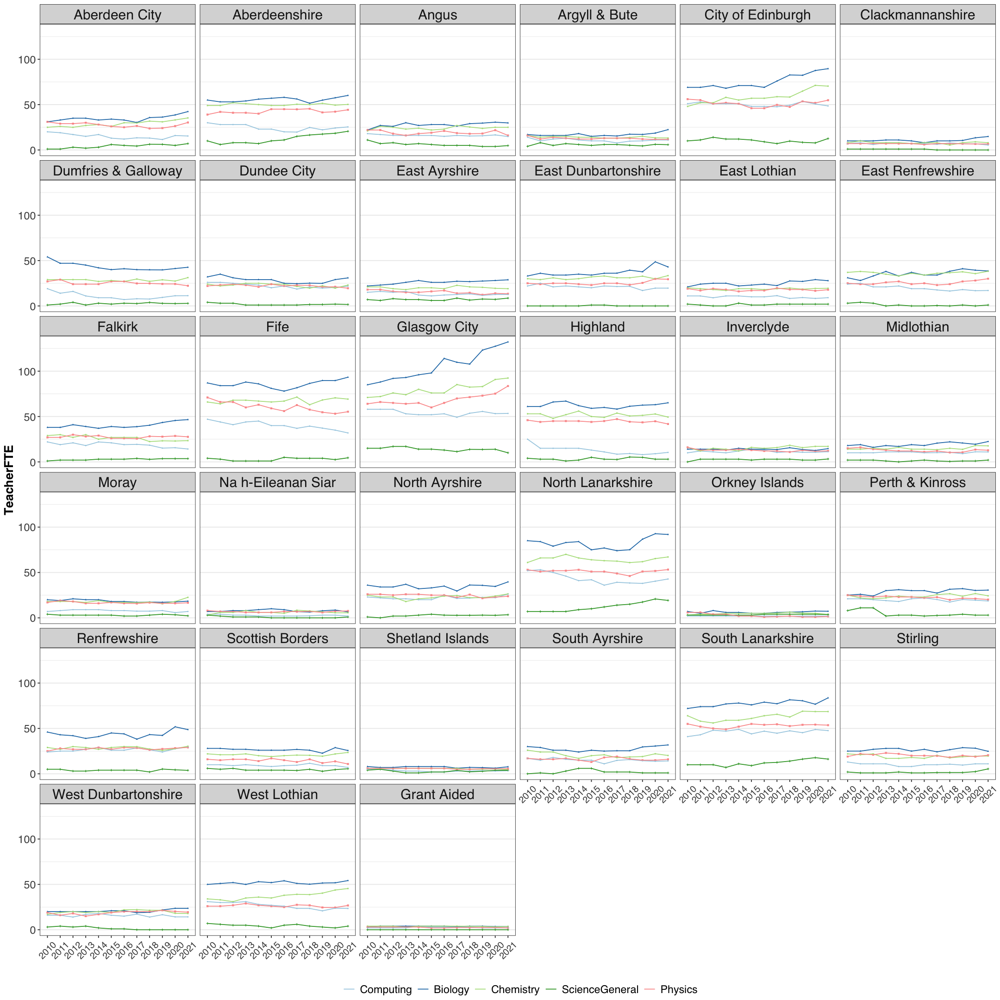

In [16]:

teacher_census %>%
    filter(SubjectGroup %in% c("Sciences", "Computing")) %>%
    
    ggplot(aes(Year, TeacherFTE, colour = Subject, group = Subject, shape = Subject)) +
        geom_point(size = 0.5, show.legend = FALSE) +
        geom_line() + 
        xlab("") + 
        dressCodeTheme +
        #khroma::scale_colour_romaO(discrete = TRUE, 
        #                           breaks = teacher_census$Subject[1], 
        #                           labels = "Subject") + 
        scale_colour_brewer("subject", palette = "Paired") + #, direction = -1) +
        theme(legend.position = "bottom", 
              legend.title = element_blank(), 
              legend.margin = margin(0),
              axis.text.y = element_text(size = 14), # element_markdown
              axis.text.x = element_text(size = 12, angle = 45, vjust = 0.5),
              ) +
        facet_wrap(~ LocalAuthority)

Warning message:
“The shape palette can deal with a maximum of 6 discrete values because
more than 6 becomes difficult to discriminate; you have 8. Consider
specifying shapes manually if you must have them.”
Warning message:
“Removed 792 rows containing missing values (geom_point).”


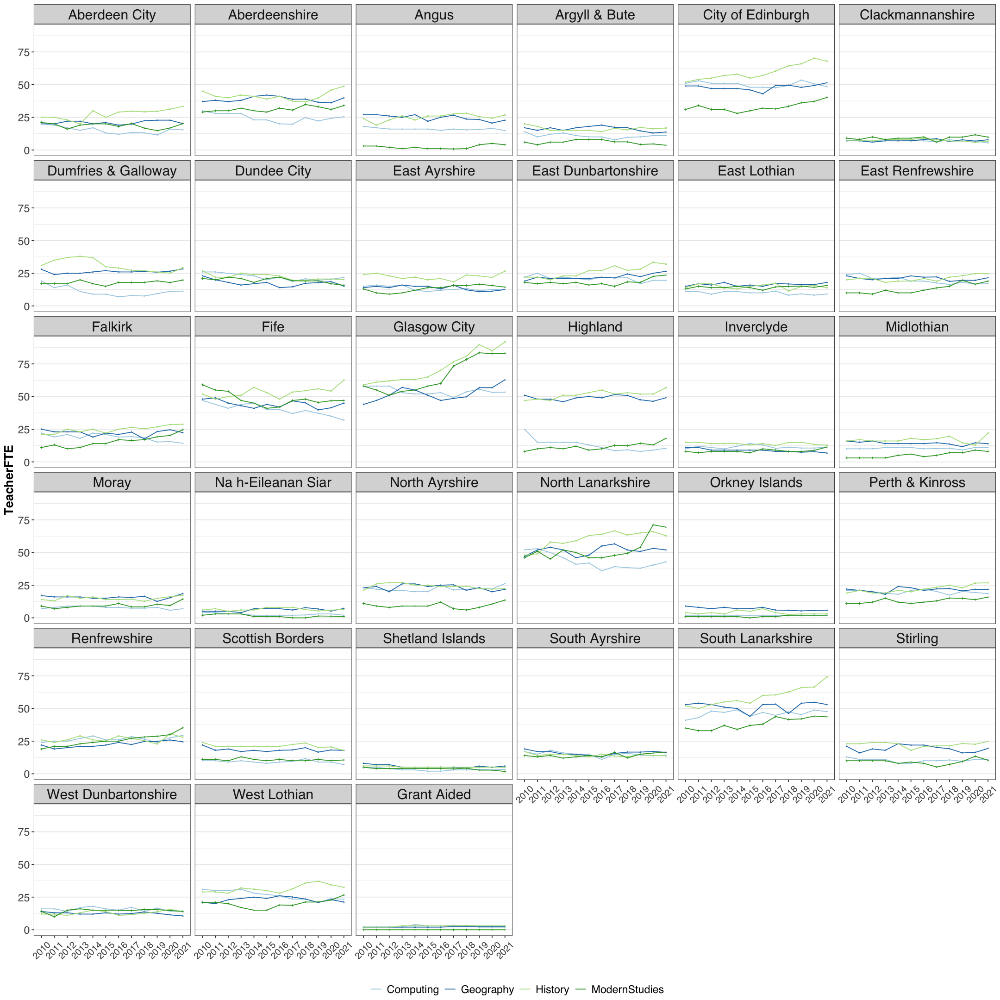

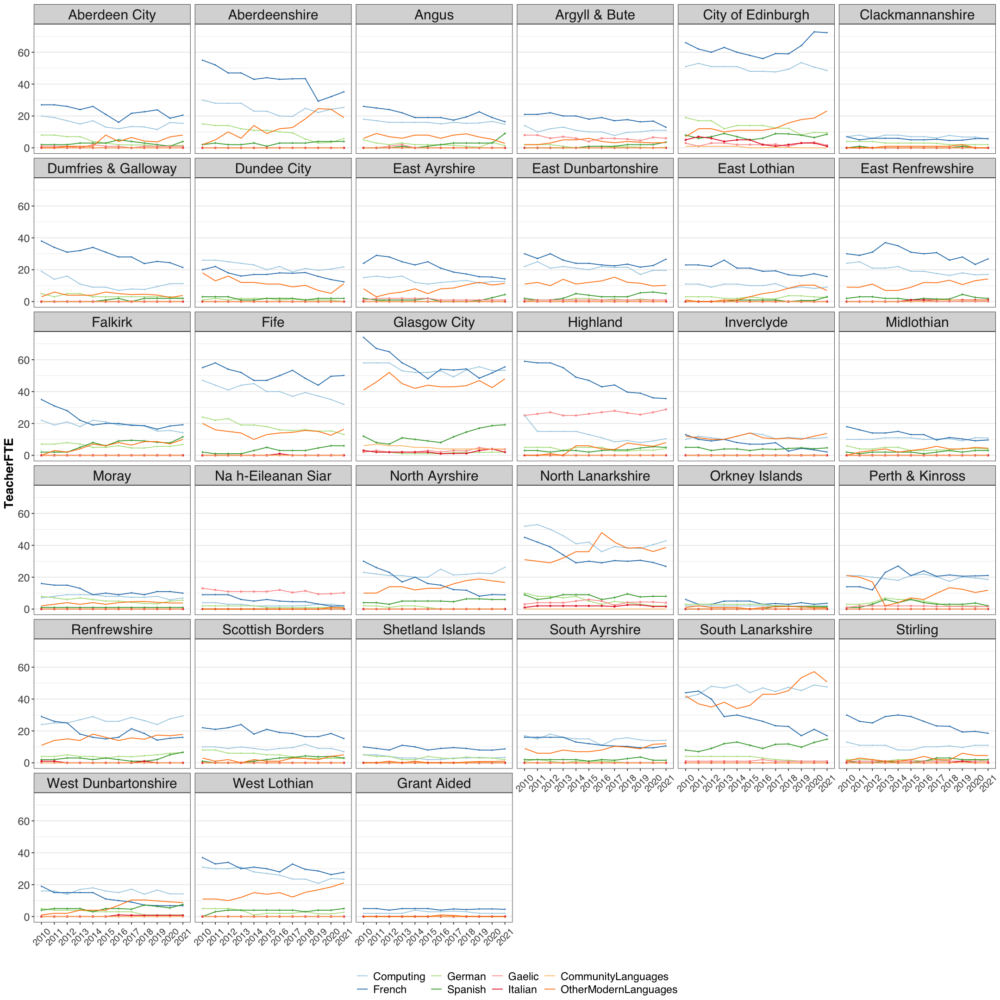

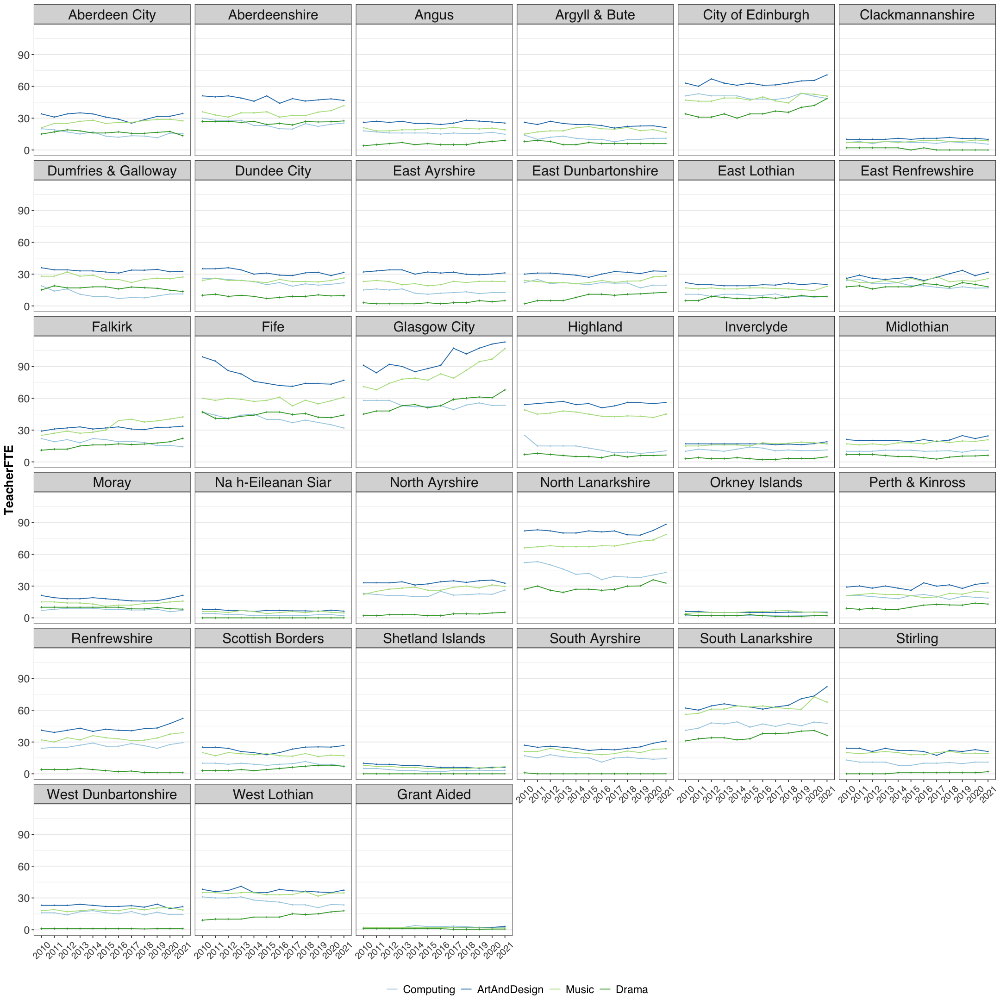

In [17]:

teacher_census %>%
    filter(SubjectGroup %in% c("ModernStudies", "Computing")) %>%
    
    ggplot(aes(Year, TeacherFTE, colour = Subject, group = Subject, shape = Subject)) +
        geom_point(size = 0.5, show.legend = FALSE) +
        geom_line() + 
        xlab("") + 
        dressCodeTheme +
        #khroma::scale_colour_romaO(discrete = TRUE, 
        #                           breaks = teacher_census$Subject[1], 
        #                           labels = "Subject") + 
        scale_colour_brewer("subject", palette = "Paired") + #, direction = -1) +
        theme(legend.position = "bottom", 
              legend.title = element_blank(), 
              legend.margin = margin(0),
              axis.text.y = element_text(size = 14), # element_markdown
              axis.text.x = element_text(size = 12, angle = 45, vjust = 0.5),
              ) +
        facet_wrap(~ LocalAuthority)



teacher_census %>%
    filter(SubjectGroup %in% c("ModernLanguages", "Computing")) %>%
    
    ggplot(aes(Year, TeacherFTE, colour = Subject, group = Subject, shape = Subject)) +
        geom_point(size = 0.5, show.legend = FALSE) +
        geom_line() + 
        xlab("") + 
        dressCodeTheme +
        #khroma::scale_colour_romaO(discrete = TRUE, 
        #                           breaks = teacher_census$Subject[1], 
        #                           labels = "Subject") + 
        scale_colour_brewer("subject", palette = "Paired") + #, direction = -1) +
        theme(legend.position = "bottom", 
              legend.title = element_blank(), 
              legend.margin = margin(0),
              axis.text.y = element_text(size = 14), # element_markdown
              axis.text.x = element_text(size = 12, angle = 45, vjust = 0.5),
              ) +
        facet_wrap(~ LocalAuthority)



teacher_census %>%
    filter(SubjectGroup %in% c("ExpressiveArt", "Computing")) %>%
    
    ggplot(aes(Year, TeacherFTE, colour = Subject, group = Subject, shape = Subject)) +
        geom_point(size = 0.5, show.legend = FALSE) +
        geom_line() + 
        xlab("") + 
        dressCodeTheme +
        #khroma::scale_colour_romaO(discrete = TRUE, 
        #                           breaks = teacher_census$Subject[1], 
        #                           labels = "Subject") + 
        scale_colour_brewer("subject", palette = "Paired") + #, direction = -1) +
        theme(legend.position = "bottom", 
              legend.title = element_blank(), 
              legend.margin = margin(0),
              axis.text.y = element_text(size = 14), # element_markdown
              axis.text.x = element_text(size = 12, angle = 45, vjust = 0.5),
              ) +
        facet_wrap(~ LocalAuthority)

In [18]:
glimpse(teacher_census)

Rows: 15,444
Columns: 6
$ Year               <ord> 2010, 2010, 2010, 2010, 2010, 2010, 2010, 2010, 201…
$ LocalAuthority     <fct> Aberdeen City, Aberdeen City, Aberdeen City, Aberde…
$ Subject            <fct> English, French, German, Spanish, Gaelic, Italian, …
$ SubjectGroup       <fct> English, ModernLanguages, ModernLanguages, ModernLa…
$ CommonSubjectLabel <fct> English, French, German, Spanish, Gaelic, Italian, …
$ TeacherFTE         <dbl> 69, 27, 8, 2, 1, 0, 0, 0, 0, 0, 71, 31, 25, 1, 31, …


### <span style = "color:maroon">Teachers Demographics &ndash; age and gender</span>

In [19]:
tmp <- read_excel("../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2015.xls",
                           sheet = "Table 3.9", col_types =  "text", trim_ws = T, skip = 4) %>%

    filter(rowSums(is.na(.)) != ncol(.)) %>%
    select_if(~ !all(is.na(.)))

    if (sum(str_detect(names(tmp), "^Female|Male")) != 4) {
        print("found")
        
        tmp <- data.frame(Year = str_match(teacher_census_datafiles[!sel_idx][[1]], "\\d{4}")[, 1],
                          MainSubjectFemale = NA_character_,
                          MainSubjectMale = NA_character_,
                          MainSubjectTotal = NA_character_,
                          OtherSubjectFemale = NA_character_,
                          OtherSubjectMale = NA_character_,
                          OtherSubjectTotal = NA_character_
                         )
        print(tmp)
    } 
#    else {

        tmp %>%
            rename(Subject = num_range("...", 1:1)) %>%
            rename_with(~ paste0("MainSubject", .), last_col(5):last_col(3)) %>%
            rename_with(~ paste0("OtherSubject", .), last_col(2):last_col()) %>%

            select(matches("Subject")) %>%
            rename_with(~ str_remove_all(., "\\.+\\d+$")) %>%

            mutate(Year = str_match("../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2015.xls", "\\d{4}")[, 1]) %>%
            relocate(Year, everything()) %>%
            filter(!(str_detect(Subject, "All subjects") | 
                     if_all(!c(Year, Subject), is.na))
                   ) %>%
            glimpse()
#    }
        
tmp %>%
    glimpse()

names(tmp)

New names:
* `` -> ...1
* Total -> Total...2
* `` -> ...3
* Total -> Total...4
* `` -> ...5
* ...



Rows: 38
Columns: 8
$ Year               <chr> "2015", "2015", "2015", "2015", "2015", "2015", "20…
$ Subject            <chr> "English", "French", "German", "Spanish", "Gaelic",…
$ MainSubjectFemale  <chr> "1852", "618", "100", "81", "38", "7", "4", "3", "2…
$ MainSubjectMale    <chr> "657", "126", "18", "15", "21", "2", "1", "2", "55"…
$ MainSubjectTotal   <chr> "2509", "744", "118", "96", "59", "9", "5", "5", "3…
$ OtherSubjectFemale <chr> "1981", "812", "299", "316", "43", "47", "9", "3", …
$ OtherSubjectMale   <chr> "695", "152", "65", "59", "23", "8", "4", "2", "65"…
$ OtherSubjectTotal  <chr> "2677", "964", "364", "375", "67", "55", "13", "5",…
Rows: 44
Columns: 14
$ ...1        <chr> "All subjects", "English", "French", "German", "Spanish", …
$ Total...2   <chr> "24418", "2992", "1070", "180", "64", "57", "12", "39", "8…
$ Total...4   <chr> "23724", "2915", "1004", "175", "66", "57", "9", "42", "7"…
$ Total...6   <chr> "23177", "2794", "952", "166", "78", "59", "10", "39", "7"…

[1] "...1"        "Total...2"   "Total...4"   "Total...6"   "Total...8"  
 [6] "Total...10"  "Total...12"  "Total...14"  "Female...16" "Male...17"  
[11] "Total...18"  "Female...20" "Male...21"   "Total...22"

In [20]:
teacher_fte_main_subject_by_la_and_gender <- data.frame()
glimpse(teacher_fte_main_subject_by_la_and_gender)


for (i in seq_along(teacher_census_datafiles[sel_idx])) {

    print(paste("Parsing file: ", teacher_census_datafiles[sel_idx][[i]], " ..."))

    teacher_fte_main_subject_by_la_and_gender <- teacher_fte_main_subject_by_la_and_gender %>%
        bind_rows(read_excel(teacher_census_datafiles[sel_idx][[i]],
                           sheet = "Table 3.9", col_types =  "text", trim_ws = T, skip = 3) %>%

                    filter(rowSums(is.na(.)) != ncol(.)) %>%
                    select_if(~ !all(is.na(.))) %>%
                    rename(Subject = num_range("...", 1:1)) %>%
                    rename_with(~ paste0("MainSubject", .), last_col(5):last_col(3)) %>%
                    rename_with(~ paste0("OtherSubject", .), last_col(2):last_col()) %>%

                    select(matches("Subject")) %>%
                    rename_with(~ str_remove_all(., "\\.+\\d+$")) %>%

                    mutate(Year = str_match(teacher_census_datafiles[sel_idx][[i]], "\\d{4}")[, 1]) %>%
                    filter(!(str_detect(Subject, "All subjects") | 
                             if_all(!c(Year, Subject), is.na))
                           ) %>% 
                    relocate(Year, everything())
                  ) 
    
    teacher_fte_main_subject_by_la_and_gender %>%
        nrow() %>%
        print()
}


for (i in seq_along(teacher_census_datafiles[!sel_idx])) {

    print(paste("Parsing file: ", teacher_census_datafiles[!sel_idx][[i]], " ..."))

    
    tmp <- read_excel(teacher_census_datafiles[!sel_idx][[i]],
                           sheet = "Table 3.9", col_types =  "text", trim_ws = T, skip = 4) %>%

                    filter(rowSums(is.na(.)) != ncol(.)) %>%
                    select_if(~ !all(is.na(.)))
    
    if (sum(str_detect(names(tmp), "^Female|Male")) != 4) {
        
        tmp <- data.frame(Year = str_match(teacher_census_datafiles[!sel_idx][[i]], "\\d{4}")[, 1],
                          Subject = NA_character_,
                          MainSubjectFemale = NA_character_,
                          MainSubjectMale = NA_character_,
                          MainSubjectTotal = NA_character_,
                          OtherSubjectFemale = NA_character_,
                          OtherSubjectMale = NA_character_,
                          OtherSubjectTotal = NA_character_
                         ) 
        
        print("Dataset empty or incomplete!")
    } 
    else {
        tmp <- tmp %>%
                    rename(Subject = num_range("...", 1:1)) %>%
                    rename_with(~ paste0("MainSubject", .), last_col(5):last_col(3)) %>%
                    rename_with(~ paste0("OtherSubject", .), last_col(2):last_col()) %>%

                    select(matches("Subject")) %>%
                    rename_with(~ str_remove_all(., "\\.+\\d+$")) %>%

                    mutate(Year = str_match(teacher_census_datafiles[!sel_idx][[i]], "\\d{4}")[, 1]) %>%
                    filter(!(str_detect(Subject, "All subjects") | 
                             if_all(!c(Year, Subject), is.na))
                           ) %>% 
                    relocate(Year, everything())
    }


    teacher_fte_main_subject_by_la_and_gender <- teacher_fte_main_subject_by_la_and_gender %>%
        bind_rows(tmp) 
    
    teacher_fte_main_subject_by_la_and_gender %>%
        nrow() %>%
        print()

}

teacher_fte_main_subject_by_la_and_gender %>%
    glimpse()

rm(tmp)



Rows: 0
Columns: 0
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2010.xls  ..."


New names:
* `` -> ...1
* Total -> Total...2
* `` -> ...3
* Total -> Total...4
* `` -> ...5
* ...



[1] 38
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2011.xls  ..."


New names:
* `` -> ...1
* Total -> Total...2
* `` -> ...3
* Total -> Total...4
* `` -> ...5
* ...



[1] 76
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2012.xls  ..."


New names:
* `` -> ...1
* Total -> Total...2
* `` -> ...3
* Total -> Total...4
* `` -> ...5
* ...



[1] 114
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2013.xls  ..."


New names:
* `` -> ...1
* Total -> Total...2
* `` -> ...3
* Total -> Total...4
* `` -> ...5
* ...



[1] 152
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2014.xls  ..."


New names:
* `` -> ...1
* Total -> Total...2
* `` -> ...3
* Total -> Total...4
* `` -> ...5
* ...



[1] "Dataset empty or incomplete!"
[1] 153
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2015.xls  ..."


New names:
* `` -> ...1
* Total -> Total...2
* `` -> ...3
* Total -> Total...4
* `` -> ...5
* ...



[1] 191
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2016.xls  ..."


New names:
* `` -> ...1
* Total -> Total...2
* `` -> ...3
* Total -> Total...4
* `` -> ...5
* ...



[1] 229
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2017.xlsx  ..."


New names:
* `` -> ...1
* Total -> Total...2
* `` -> ...3
* Total -> Total...4
* `` -> ...5
* ...



[1] 267
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2018.xlsx  ..."


New names:
* `` -> ...1
* Total -> Total...2
* `` -> ...3
* Total -> Total...4
* `` -> ...5
* ...



[1] 305
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_2020_3.xlsx  ..."


New names:
* `` -> ...1
* Total -> Total...2
* `` -> ...3
* Total -> Total...4
* `` -> ...5
* ...



[1] 344
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_Supplementary_Statistics_2021.xlsx  ..."


New names:
* `` -> ...1
* Total -> Total...2
* `` -> ...3
* Total -> Total...4
* `` -> ...5
* ...



[1] 383
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_Supplmentary_Tables_2019.xlsx  ..."


New names:
* `` -> ...1
* Total -> Total...2
* `` -> ...3
* Total -> Total...4
* `` -> ...5
* ...



[1] 421
Rows: 421
Columns: 8
$ Year               <chr> "2010", "2010", "2010", "2010", "2010", "2010", "20…
$ Subject            <chr> "English", "French", "German", "Spanish", "Gaelic",…
$ MainSubjectFemale  <chr> "2015", "800", "129", "67", "43", "6", "32", "5", "…
$ MainSubjectMale    <chr> "779", "152", "36", "11", "17", "4", "7", "2", "56"…
$ MainSubjectTotal   <chr> "2794", "952", "166", "78", "59", "10", "39", "7", …
$ OtherSubjectFemale <chr> "2167", "1029", "452", "278", "52", "59", "38", "5"…
$ OtherSubjectMale   <chr> "820", "196", "99", "52", "23", "14", "8", "2", "61…
$ OtherSubjectTotal  <chr> "2987", "1225", "550", "330", "74", "73", "46", "7"…


In [21]:
teacher_fte_main_subject_by_la_and_gender %>%
    group_by(Year) %>%
    slice_sample(n = 1)

teacher_fte_main_subject_by_la_and_gender %>%
    distinct(Subject)

Year,Subject,MainSubjectFemale,MainSubjectMale,MainSubjectTotal,OtherSubjectFemale,OtherSubjectMale,OtherSubjectTotal
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
2010,Visual impairment,11,3,14,12,3,15
2011,PSE/Guidance,348,133,481,1056,480,1536
2012,Physics,239,598,837,271,658,929
2013,Physics,240,582,822,272,634,906
2014,NA,NA,NA,NA,NA,NA,NA
2015,Economics,2,4,6,53,22,74
2016,Hearing impairment,24,1,25,25,1,26
2017,Chemistry,622.51,359.24,981.75,709.01,431.55,1140.56
2018,General Science,69.099999999999994,75.3,144.39999999999998,947.01,683.66,1630.67


Subject
<chr>
English
French
German
Spanish
Gaelic
Italian
English as Additional Language
Community Languages
Other Modern Languages


In [22]:
teacher_fte_main_subject_by_la_and_gender %>%
    filter(if_any(!c(Year, Subject), ~ (. %in% c("*", "-"))))

Year,Subject,MainSubjectFemale,MainSubjectMale,MainSubjectTotal,OtherSubjectFemale,OtherSubjectMale,OtherSubjectTotal
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
2020,Italian,8.4,*,10.4,39.090000000000003,8,47.089999999999996
2020,English as Additional Language,*,*,7.7,*,*,22.39
2020,Community Languages,*,*,4.8,*,*,4.8
2020,Classical Studies,*,*,10.5,23.740000000000002,16,39.74
2020,Economics,*,*,1,44.07,17,61.07
2020,Media Studies,*,*,13.2,81.710000000000008,42.82,124.53000000000002
2020,physical disabilities,*,*,6.8,14.010000000000002,6.6,20.61
2020,Hearing impairment,*,*,24.1,*,*,26.700000000000003
2020,Visual impairment,*,*,6.8,*,*,7.8


In [23]:
teacher_fte_main_subject_by_la_and_gender %>%
    slice_sample(n = 6)

Year,Subject,MainSubjectFemale,MainSubjectMale,MainSubjectTotal,OtherSubjectFemale,OtherSubjectMale,OtherSubjectTotal
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
2019,Gaelic,37.79,20.7,58.489999999999995,43.97,22.7,66.669999999999987
2017,Community Languages,3.36,2,5.3599999999999994,3.36,2,5.3599999999999994
2012,Learning support,768,174,942,873,202,1075
2021,Other / not known,199.89,78.64,278.52999999999997,1089.6599999999999,570.68000000000006,1660.34
2010,Technical Education,206,1110,1316,227,1188,1415
2015,behavioural support,62,27,90,87,41,128


In [24]:
teacher_fte_main_subject_by_la_and_gender <- teacher_fte_main_subject_by_la_and_gender %>%
    drop_na(Subject) %>%
    mutate(across(Subject, 
                 ~ if_else(!str_detect(., "ASN") & ((. %in% c("Learning support", "general", "behavioural support")) | 
                                                         str_detect(., "difficult(y|ies)|disabilit(y|ies)|impairment")), 
                            paste("ASN", .), .)),
           across(Subject, ~ snakecase::to_upper_camel_case(coalesce(., ""), abbreviations = c("ASN", "PSE")))
          ) %>%

    left_join(select_focus_subjects %>%
                 mutate(across(c(Subject, SubjectGroup), as.character),
                        across(Subject, ~ snakecase::to_upper_camel_case(.))
                       )
              ) %>%

    relocate(c(SubjectGroup, CommonSubjectLabel), .after = Subject) %>%
    mutate(across(SubjectGroup, ~ case_when(str_detect(Subject, "English\\w+(Additional|Other)Language") ~ "OtherEnglish",
                                            str_detect(Subject, "English") ~ "English",
                                            Subject %in% c("OtherModernLanguages", "CommunityLanguages") ~ "ModernLanguages",
                                            str_detect(Subject, "Drama") ~ "ExpressiveArt",
                                            str_detect(Subject, "ScienceGeneral|GeneralScience") ~ "Sciences",
                                            Subject %in% c("ReligiousEducation") ~ "ReligiousAndMoralEducation",
                                            Subject %in% c("HomeEconomics") ~ "HealthAndWellBeing",
                                            (Subject %in% c("LearningSupport", "HearingImpairment", "VisualImpairment")) | 
                                                str_detect(Subject, "^ASN") ~ "ASN",
                                            TRUE ~ .
                                         )),
           ) %>%
    mutate(across(c(Subject, SubjectGroup), as.factor),
           across(Subject, ~ fct_collapse(., "Other" = c("OtherNotKnown", "NotKnown"))),
           across(Subject, ~ fct_inorder(.)),
           across(Subject, ~ fct_relevel(., "ComputingStudies"))
          ) %>%
    glimpse()


Joining, by = "Subject"


Rows: 420
Columns: 10
$ Year               <chr> "2010", "2010", "2010", "2010", "2010", "2010", "20…
$ Subject            <fct> English, French, German, Spanish, Gaelic, Italian, …
$ SubjectGroup       <fct> English, ModernLanguages, ModernLanguages, ModernLa…
$ CommonSubjectLabel <fct> English, French, German, Spanish, Gaelic, Italian, …
$ MainSubjectFemale  <chr> "2015", "800", "129", "67", "43", "6", "32", "5", "…
$ MainSubjectMale    <chr> "779", "152", "36", "11", "17", "4", "7", "2", "56"…
$ MainSubjectTotal   <chr> "2794", "952", "166", "78", "59", "10", "39", "7", …
$ OtherSubjectFemale <chr> "2167", "1029", "452", "278", "52", "59", "38", "5"…
$ OtherSubjectMale   <chr> "820", "196", "99", "52", "23", "14", "8", "2", "61…
$ OtherSubjectTotal  <chr> "2987", "1225", "550", "330", "74", "73", "46", "7"…


In [25]:
teacher_fte_main_subject_by_la_and_gender %>%
    slice_sample(n = 8)

teacher_fte_main_subject_by_la_and_gender %>%
    distinct(Subject, SubjectGroup)

Year,Subject,SubjectGroup,CommonSubjectLabel,MainSubjectFemale,MainSubjectMale,MainSubjectTotal,OtherSubjectFemale,OtherSubjectMale,OtherSubjectTotal
<chr>,<fct>,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
2020,ASNLearningDifficulties,ASN,NA,146.55000000000001,32.869999999999997,179.42000000000002,178.74,44.67,223.41000000000003
2018,OtherModernLanguages,ModernLanguages,NA,307.85000000000002,69.87,377.72,338.12,80.41,418.53000000000003
2018,ComputingStudies,Computing,NA,258.77,335.85,594.62,426.13,423.99,850.12
2016,Geography,ModernStudies,NA,496,259,755,573,298,871
2017,Biology,Sciences,Biology,849.12,304.32,1153.44,966.2,363.7,1329.9
2018,ASNPhysicalDisabilities,ASN,NA,3.7,3,6.7,14.41,6,20.41
2019,SpeechAndDrama,ExpressiveArt,NA,336.52,94.32,430.84,395.76,111.28,507.03999999999996
2017,EnglishAsAdditionalLanguage,OtherEnglish,NA,4,1.05,5.05,11.99,2.0499999999999998,14.04


Subject,SubjectGroup
<fct>,<fct>
English,English
French,ModernLanguages
German,ModernLanguages
Spanish,ModernLanguages
Gaelic,ModernLanguages
Italian,ModernLanguages
EnglishAsAdditionalLanguage,OtherEnglish
CommunityLanguages,ModernLanguages
OtherModernLanguages,ModernLanguages


#### <span style = "color:maroon">Teacher Census &ndash; Main Subject by Age</span>

In [26]:
teacher_fte_main_subject_by_age <- data.frame()
glimpse(teacher_fte_main_subject_by_age)


for (i in seq_along(teacher_census_datafiles[sel_idx])) {

    print(paste("Parsing file: ", teacher_census_datafiles[sel_idx][[i]], " ..."))

    teacher_fte_main_subject_by_age <- teacher_fte_main_subject_by_age %>%
        bind_rows(read_excel(teacher_census_datafiles[sel_idx][[i]],
                           sheet = "Table 3.10", col_types =  "text", trim_ws = T, skip = 1) %>%

                    filter(rowSums(is.na(.)) != ncol(.)) %>%
                    rename_with(~ c("Subject"), matches("^...1$")) %>%
                    select(- matches("^\\.+\\d+")) %>%

                    mutate(across(!Subject, ~ if_else((. == "-"), "0", .)),
                           Year = str_match(teacher_census_datafiles[sel_idx][[i]], "\\d{4}")[, 1]) %>%
                    relocate(Year, everything())
                  ) %>% 
     filter(!(str_detect(Subject, "All subjects") | 
             if_all(!c(Year, Subject), is.na))
           )
   
    teacher_fte_main_subject_by_age %>%
        nrow() %>%
        print()
}


for (i in seq_along(teacher_census_datafiles[!sel_idx])) {

    print(paste("Parsing file: ", teacher_census_datafiles[!sel_idx][[i]], " ..."))

    teacher_fte_main_subject_by_age <- teacher_fte_main_subject_by_age %>%
        bind_rows(read_excel(teacher_census_datafiles[!sel_idx][[i]],
                           sheet = "Table 3.10", col_types =  "text", trim_ws = T, skip = 2) %>%

                    filter(rowSums(is.na(.)) != ncol(.)) %>%
                    rename_with(~ c("Subject"), matches("^...1$")) %>%
                    select(- matches("^\\.+\\d+")) %>%

                    mutate(across(!Subject, ~ if_else((. == "-"), "0", .)),
                           Year = str_match(teacher_census_datafiles[!sel_idx][[i]], "\\d{4}")[, 1]) %>%
                    relocate(Year, everything())
                  ) %>% 
     filter(!(str_detect(Subject, "All subjects") | 
             if_all(!c(Year, Subject), is.na))
           ) 
    
    teacher_fte_main_subject_by_age %>%
        nrow() %>%
        print()

}

teacher_fte_main_subject_by_age %>%
    glimpse()

teacher_fte_main_subject_by_age %>%
    group_by(Year) %>%
    slice_sample(n = 1)

Rows: 0
Columns: 0
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2010.xls  ..."


New names:
* `` -> ...1
* `` -> ...11



[1] 0
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2011.xls  ..."


New names:
* `` -> ...1
* `` -> ...11



[1] 38
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2012.xls  ..."


New names:
* `` -> ...1
* `` -> ...11



[1] 76
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2013.xls  ..."


New names:
* `` -> ...1
* `` -> ...11



[1] 114
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2014.xls  ..."


New names:
* `` -> ...1
* `` -> ...11



[1] 114
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2015.xls  ..."


New names:
* `` -> ...1
* `` -> ...11



[1] 152
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2016.xls  ..."


New names:
* `` -> ...1
* `` -> ...11



[1] 191
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2017.xlsx  ..."


New names:
* `` -> ...1
* `` -> ...11



[1] 229
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2018.xlsx  ..."


New names:
* `` -> ...1
* `` -> ...11



[1] 267
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_2020_3.xlsx  ..."


New names:
* `` -> ...1
* `` -> ...12



[1] 305
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_Supplementary_Statistics_2021.xlsx  ..."


New names:
* `` -> ...1
* `` -> ...12



[1] 343
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_Supplmentary_Tables_2019.xlsx  ..."


New names:
* `` -> ...1
* `` -> ...12



[1] 381
Rows: 381
Columns: 14
$ Year          <chr> "2011", "2011", "2011", "2011", "2011", "2011", "2011", …
$ Subject       <chr> "English", "French", "German", "Spanish", "Gaelic", "Ita…
$ `Under 25`    <chr> "97", "17", "*", "*", "6", "*", "*", "*", "6", "*", "119…
$ `25-29`       <chr> "446", "104", "16", "*", "11", "*", "*", "*", "48", "*",…
$ `30-34`       <chr> "424", "130", "17", "11", "8", "*", "*", "*", "33", "*",…
$ `35-39`       <chr> "313", "91", "14", "5", "7", "*", "*", "*", "31", "*", "…
$ `40-44`       <chr> "292", "116", "29", "7", "7", "*", "*", "*", "45", "*", …
$ `45-49`       <chr> "298", "111", "18", "8", "7", "*", "*", "*", "31", "*", …
$ `50-54`       <chr> "377", "148", "26", "9", "6", "*", "8", "*", "38", "*", …
$ `55-59`       <chr> "316", "138", "*", "*", "*", "*", "10", "*", "46", "*", …
$ `60 or over`  <chr> "113", "45", "*", "*", "*", "*", "5", "*", "8", "*", "82…
$ Average       <chr> "41", "43", "45", "42", "40", "48", "52", "51", "42", "4…
$ `60-64` 

Year,Subject,Under 25,25-29,30-34,35-39,40-44,45-49,50-54,55-59,60 or over,Average,60-64,65 and over
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
2011,Speech and Drama,*,71,80,30,39,44,50,*,*,39,NA,NA
2012,Technical Education,71,180,155,113,111,170,255,181,76,43,NA,NA
2013,Economics,0,0,0,0,*,0,0,*,*,55,NA,NA
2015,Italian,0,*,0,*,*,*,0,*,*,47,NA,NA
2016,Religious Education,49,89,72,76,81,71,73,61,39,41,NA,NA
2017,PSE/Guidance,0,14,77.510000000000005,86.82,103.22,75.17,67.540000000000006,59.080000000000005,31.510000000000005,44.31752937748859,NA,NA
2018,Religious Education,38.799999999999997,106.38,85.85,72.430000000000007,81.180000000000007,76.790000000000006,66.3,59.12,31.4,40.36396279822079,NA,NA
2019,Physical Education,279.20999999999998,455.02,368.77,334.45,174.31,111.59,65.8,71.25,NA,34.455840888842296,38.799999999999997,8.9
2020,learning difficulties,0,*,*,24.58,25.56,26.92,22.09,33.32,NA,48.589009029093752,23.76,6.6


In [27]:
teacher_fte_main_subject_by_age <- teacher_fte_main_subject_by_age %>%
    drop_na(Subject) %>%
    mutate(across(Subject, 
                 ~ if_else(!str_detect(., "ASN") & ((. %in% c("Learning support", "general", "behavioural support")) | 
                                                         str_detect(., "difficult(y|ies)|disabilit(y|ies)|impairment")), 
                            paste("ASN", .), .)),
           across(Subject, ~ snakecase::to_upper_camel_case(coalesce(., ""), abbreviations = c("ASN", "PSE")))
          ) %>%

    left_join(select_focus_subjects %>%
                 mutate(across(c(Subject, SubjectGroup), as.character),
                        across(Subject, ~ snakecase::to_upper_camel_case(.))
                       )
              ) %>%

    relocate(c(SubjectGroup, CommonSubjectLabel), .after = Subject) %>%
    mutate(across(SubjectGroup, ~ case_when(str_detect(Subject, "English\\w+(Additional|Other)Language") ~ "OtherEnglish",
                                            str_detect(Subject, "English") ~ "English",
                                            Subject %in% c("OtherModernLanguages", "CommunityLanguages") ~ "ModernLanguages",
                                            str_detect(Subject, "Drama") ~ "ExpressiveArt",
                                            str_detect(Subject, "ScienceGeneral|GeneralScience") ~ "Sciences",
                                            Subject %in% c("ReligiousEducation") ~ "ReligiousAndMoralEducation",
                                            Subject %in% c("HomeEconomics") ~ "HealthAndWellBeing",
                                            (Subject %in% c("LearningSupport", "HearingImpairment", "VisualImpairment")) | 
                                                str_detect(Subject, "^ASN") ~ "ASN",
                                            TRUE ~ .
                                         )),
           ) %>%
    filter(Subject != "AdditionalSupportNeeds") %>%
    
    mutate(across(c(Subject, SubjectGroup), as.factor),
           across(Subject, ~ fct_collapse(., "Other" = c("OtherNotKnown", "NotKnown"))),
           across(Subject, ~ fct_inorder(.)),
           across(Subject, ~ fct_relevel(., "ComputingStudies")),
           
           across(Year, ~ as.ordered(as.integer(.))),
           across(where(is.character), as.numeric)
          ) %>%
    select(- where(~ all(is.na(.)))) %>%

    pivot_longer(where(is.double), names_to = "Age", values_to = "TeacherFTE")%>%
    mutate(across(Age, as.factor),
           across(Age, ~ fct_collapse(., ">= 60" = (str_match(., "^6.+")[, 1] %>%
                                                         `[`(!is.na(.)))
                                     )),
           across(Age, ~ fct_recode(., "< 25" = "Under 25")),
           across(Age, ~ fct_relevel(., "< 25"))
          ) %>%

    suppressWarnings() %>%
    glimpse()

Joining, by = "Subject"


Rows: 4,560
Columns: 6
$ Year               <ord> 2011, 2011, 2011, 2011, 2011, 2011, 2011, 2011, 201…
$ Subject            <fct> English, English, English, English, English, Englis…
$ SubjectGroup       <fct> English, English, English, English, English, Englis…
$ CommonSubjectLabel <fct> English, English, English, English, English, Englis…
$ Age                <fct> < 25, 25-29, 30-34, 35-39, 40-44, 45-49, 50-54, 55-…
$ TeacherFTE         <dbl> 97, 446, 424, 313, 292, 298, 377, 316, 113, 41, NA,…


In [28]:
teacher_fte_main_subject_by_age <- teacher_fte_main_subject_by_age %>%
    filter(Age != ">= 60") %>%

    bind_rows(teacher_fte_main_subject_by_age %>%
                filter(Age == ">= 60") %>%
                distinct(across(!TeacherFTE)) %>% # need to maintain NA across all

                left_join(teacher_fte_main_subject_by_age %>%
                            filter(Age == ">= 60") %>%
                            drop_na(TeacherFTE) %>%
                            group_by(across(!TeacherFTE)) %>%
                            summarise(across(TeacherFTE, sum))
                         )
             ) %>%
    arrange(Year, Age)

`summarise()` has grouped output by 'Year', 'Subject', 'SubjectGroup', 'CommonSubjectLabel'. You can override using the `.groups` argument.
Joining, by = c("Year", "Subject", "SubjectGroup", "CommonSubjectLabel", "Age")


In [29]:
range(teacher_fte_main_subject_by_age$Year, na.rm = TRUE)

[1] 2011 2021
10 Levels: 2011 < 2012 < 2013 < 2015 < 2016 < 2017 < 2018 < 2019 < ... < 2021

`summarise()` has grouped output by 'Age'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'Age'. You can override using the `.groups` argument.
`summarise()` has grouped output by 'Age'. You can override using the `.groups` argument.


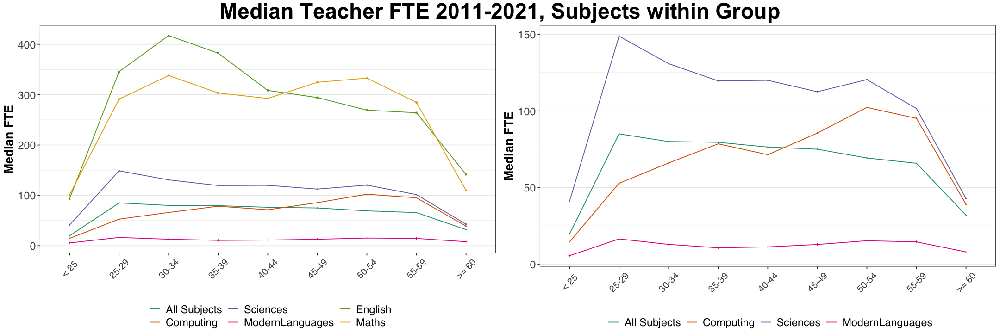

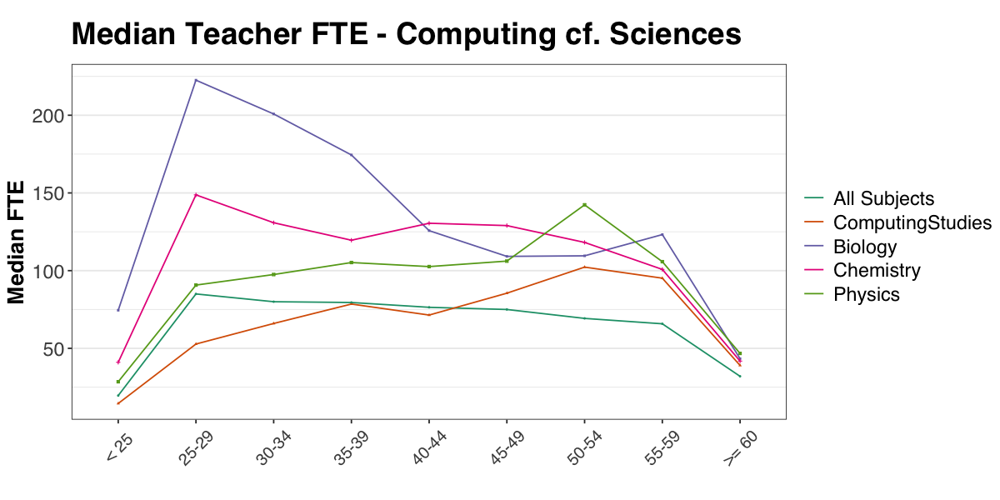

In [30]:
options(repr.plot.width = 18, repr.plot.height = 6)

plot1 <- teacher_fte_main_subject_by_age %>%
    filter(Age != "Average") %>%
    group_by(Age) %>%
    summarise(across(TeacherFTE, list(median = median, average = mean), na.rm = TRUE)) %>%

    bind_rows(teacher_fte_main_subject_by_age %>%
                filter(Age != "Average") %>%
                filter(SubjectGroup %in% c("Computing", "Sciences", "ModernLanguages") & 
                       !(Subject %in% c("GeneralScience", "CommunityLanguages", "OtherModernLanguages"))) %>%
                group_by(Age, SubjectGroup) %>%
                summarise(across(TeacherFTE, list(median = median, average = mean), na.rm = TRUE))
    ) %>%
    mutate(across(SubjectGroup, ~ fct_explicit_na(., "All Subjects")),
           across(SubjectGroup, ~ fct_relevel(., "All Subjects")),
           across(SubjectGroup, ~ fct_relevel(., "ModernLanguages", after = Inf)),
          ) %>%
    #arrange(Age, SubjectGroup) %>%
    
    ggplot(aes(Age, TeacherFTE_median, colour = SubjectGroup, group = SubjectGroup, shape = SubjectGroup)) +
        geom_point(size = 0.5, show.legend = FALSE) +
        geom_line() + 
        #ggtitle("Median Teacher FTE - Subjects within Group") + 
        ylab("Median FTE") + xlab("") + 
        dressCodeTheme +
        scale_colour_brewer("subject", palette = "Dark2") + #, direction = -1) +
        theme(legend.position = "bottom", 
              legend.title = element_blank(), 
              legend.margin = margin(0),
              axis.text.y = element_text(size = 14), # element_markdown
              axis.text.x = element_text(size = 12, angle = 45, vjust = 0.5),
              )

plot2 <- teacher_fte_main_subject_by_age %>%
    filter(Age != "Average") %>%
    group_by(Age) %>%
    summarise(across(TeacherFTE, list(median = median, average = mean), na.rm = TRUE)) %>%

    bind_rows(teacher_fte_main_subject_by_age %>%
                filter(Age != "Average") %>%
                filter(SubjectGroup %in% c("Computing", "Sciences", "ModernLanguages", "English", "Maths") & 
                       !(Subject %in% c("GeneralScience", "CommunityLanguages", "OtherModernLanguages"))) %>%
                group_by(Age, SubjectGroup) %>%
                summarise(across(TeacherFTE, list(median = median, average = mean), na.rm = TRUE))
    ) %>%
    mutate(across(SubjectGroup, ~ fct_explicit_na(., "All Subjects")),
           across(SubjectGroup, ~ fct_relevel(., "All Subjects")),
           across(SubjectGroup, ~ fct_relevel(., "ModernLanguages", "English", "Maths", after = Inf)),
          ) %>%
    
    ggplot(aes(Age, TeacherFTE_median, colour = SubjectGroup, group = SubjectGroup, shape = SubjectGroup)) +
        geom_point(size = 0.5, show.legend = FALSE) +
        geom_line() + 
        #ggtitle("Median Teacher FTE - Subjects within Group") + 
        ylab("Median FTE") + xlab("") + 
        dressCodeTheme +
        scale_colour_brewer("subject", palette = "Dark2") + #, direction = -1) +
        theme(legend.position = "bottom", 
              legend.title = element_blank(), 
              legend.margin = margin(0),
              axis.text.y = element_text(size = 14), # element_markdown
              axis.text.x = element_text(size = 12, angle = 45, vjust = 0.5),
              )


gridExtra::grid.arrange(plot2, plot1, nrow = 1,   
                        top = grid::grid.text("Median Teacher FTE 2011-2021, Subjects within Group",
                                              gp = grid::gpar(fontsize = 28, fontface = "bold")
  )
) 
rm(plot1, plot2)


options(repr.plot.width = 10, repr.plot.height = 5)

teacher_fte_main_subject_by_age %>%
    filter(Age != "Average") %>%
    group_by(Age) %>%
    summarise(across(TeacherFTE, list(median = median, average = mean), na.rm = TRUE)) %>%

    bind_rows(teacher_fte_main_subject_by_age %>%
                filter(Age != "Average") %>%
                filter((SubjectGroup  == "Computing") | 
                       (Subject %in% c("Biology", "Chemistry", "Physics"))) %>%
                group_by(Age, Subject) %>%
                summarise(across(TeacherFTE, list(median = median, average = mean), na.rm = TRUE))
    ) %>%
    mutate(across(Subject, ~ fct_explicit_na(., "All Subjects")),
           across(Subject, ~ fct_relevel(., "All Subjects")),
          ) %>%
    arrange(Age, Subject) %>%
    
    ggplot(aes(Age, TeacherFTE_median, colour = Subject, group = Subject, shape = Subject)) +
        geom_point(size = 0.5, show.legend = FALSE) +
        geom_line() + 
        ggtitle("Median Teacher FTE - Computing cf. Sciences") + 
        ylab("Median FTE") + xlab("") + 
        dressCodeTheme +
        scale_colour_brewer("subject", palette = "Dark2") + #, direction = -1) +
        theme(#legend.position = "bottom", 
              legend.title = element_blank(), 
              legend.margin = margin(0),
              axis.text.y = element_text(size = 14), # element_markdown
              axis.text.x = element_text(size = 12, angle = 45, vjust = 0.5),
              )

`summarise()` has grouped output by 'Year'. You can override using the `.groups` argument.


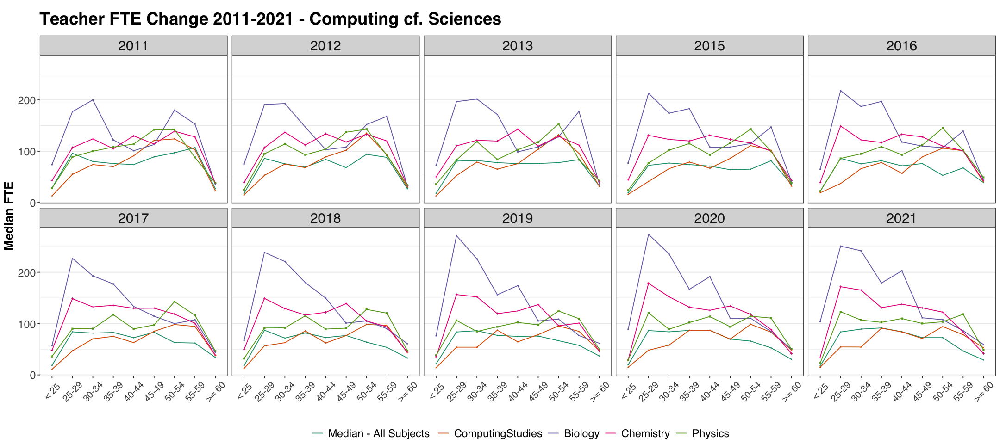

In [31]:
options(repr.plot.width = 18, repr.plot.height = 8)

teacher_fte_main_subject_by_age %>%
    filter(Age != "Average") %>%
    group_by(Year, Age) %>%
    summarise(across(TeacherFTE, median, na.rm = TRUE)) %>%

    bind_rows(teacher_fte_main_subject_by_age %>%
                filter(Age != "Average") %>%
                filter((SubjectGroup  == "Computing") | 
                       (Subject %in% c("Biology", "Chemistry", "Physics"))) %>%
                select(Year, Age, Subject, TeacherFTE)
    ) %>%

    mutate(across(Subject, ~ fct_explicit_na(., "Median - All Subjects")),
           across(Subject, ~ fct_relevel(., "Median - All Subjects")),
          ) %>%
    #arrange(Year, Age, Subject) %>%
    
    ggplot(aes(Age, TeacherFTE, colour = Subject, group = Subject, shape = Subject)) +
        geom_point(size = 0.5, show.legend = FALSE) +
        geom_line() + 
        ggtitle("Teacher FTE Change 2011-2021 - Computing cf. Sciences") + 
        ylab("Median FTE") + xlab("") + 
        dressCodeTheme +
        scale_colour_brewer("subject", palette = "Dark2") + #, direction = -1) +
        theme(legend.position = "bottom", 
              legend.title = element_blank(), 
              legend.margin = margin(0),
              axis.text.y = element_text(size = 14), # element_markdown
              axis.text.x = element_text(size = 12, angle = 45, vjust = 0.5),
              ) +
        facet_wrap(~ Year, nrow = 2)

#### <span style = "color:maroon">Teacher Census &ndash; Local Authority by Age</span>

In [32]:
teacher_fte_local_authority_by_age <- data.frame()
glimpse(teacher_fte_local_authority_by_age)


for (i in seq_along(teacher_census_datafiles[sel_idx])) {

    print(paste("Parsing file: ", teacher_census_datafiles[sel_idx][[i]], " ..."))

    teacher_fte_local_authority_by_age <- teacher_fte_local_authority_by_age %>%
        bind_rows(read_excel(teacher_census_datafiles[sel_idx][[i]],
                           sheet = "Table 8.3", col_types =  "text", trim_ws = T, skip = 1) %>%

                    filter(rowSums(is.na(.)) != ncol(.)) %>%
                    rename_with(~ c("LocalAuthority"), matches("^...1$")) %>%
                    select(- matches("^\\.+\\d+")) %>%

                    mutate(across(!LocalAuthority, ~ if_else((. == "-"), "0", .)),
                           Year = str_match(teacher_census_datafiles[sel_idx][[i]], "\\d{4}")[, 1]) %>%
                    relocate(Year, everything())
                  ) %>% 
     filter(!(str_detect(LocalAuthority, regex("All Local Authorities", ignore_case = TRUE)) | 
             if_all(!c(Year, LocalAuthority), is.na))
           ) 
    
    teacher_fte_local_authority_by_age %>%
        nrow() %>%
        print()
}


for (i in seq_along(teacher_census_datafiles[!sel_idx])) {

    print(paste("Parsing file: ", teacher_census_datafiles[!sel_idx][[i]], " ..."))

    teacher_fte_local_authority_by_age <- teacher_fte_local_authority_by_age %>%
        bind_rows(read_excel(teacher_census_datafiles[!sel_idx][[i]],
                           sheet = "Table 8.3", col_types =  "text", trim_ws = T, skip = 2) %>%

                    filter(rowSums(is.na(.)) != ncol(.)) %>%
                    rename_with(~ c("LocalAuthority"), matches("^...1$")) %>%
                    select(- matches("^\\.+\\d+")) %>%

                    mutate(across(!LocalAuthority, ~ if_else((. == "-"), "0", .)),
                           Year = str_match(teacher_census_datafiles[!sel_idx][[i]], "\\d{4}")[, 1]) %>%
                    relocate(Year, everything())
                  ) %>% 
     filter(!(str_detect(LocalAuthority, regex("All Local Authorities", ignore_case = TRUE)) | 
             if_all(!c(Year, LocalAuthority), is.na))
           ) 
    
    teacher_fte_local_authority_by_age %>%
        nrow() %>%
        print()

}

teacher_fte_local_authority_by_age %>%
    glimpse()

teacher_fte_local_authority_by_age %>%
    group_by(Year) %>%
    slice_sample(n = 1)

Rows: 0
Columns: 0
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2010.xls  ..."


New names:
* `` -> ...1
* `` -> ...10



[1] 0
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2011.xls  ..."


New names:
* `` -> ...1
* `` -> ...10



[1] 32
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2012.xls  ..."


New names:
* `` -> ...1
* `` -> ...10



[1] 64
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2013.xls  ..."


New names:
* `` -> ...1
* `` -> ...10



[1] 96
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2014.xls  ..."


New names:
* `` -> ...1
* `` -> ...10



[1] 128
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2015.xls  ..."


New names:
* `` -> ...1
* `` -> ...10



[1] 160
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2016.xls  ..."


New names:
* `` -> ...1
* `` -> ...10



[1] 192
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2017.xlsx  ..."


New names:
* `` -> ...1
* `` -> ...10



[1] 224
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2018.xlsx  ..."


New names:
* `` -> ...1
* `` -> ...10



[1] 256
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_2020_3.xlsx  ..."


New names:
* `` -> ...1
* `` -> ...12



[1] 288
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_Supplementary_Statistics_2021.xlsx  ..."


New names:
* `` -> ...1
* `` -> ...12



[1] 320
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_Supplmentary_Tables_2019.xlsx  ..."


New names:
* `` -> ...1
* `` -> ...12



[1] 352
Rows: 352
Columns: 15
$ Year           <chr> "2011", "2011", "2011", "2011", "2011", "2011", "2011",…
$ LocalAuthority <chr> "Aberdeen City", "Aberdeenshire", "Angus", "Argyll & Bu…
$ `Under 25`     <chr> "36", "41", "35", "9", "3", "43", "32", "25", "26", "32…
$ `25-29`        <chr> "83", "138", "73", "42", "31", "92", "91", "76", "79", …
$ `30-34`        <chr> "100", "135", "67", "57", "33", "94", "67", "78", "71",…
$ `35-39`        <chr> "92", "117", "51", "44", "25", "76", "84", "68", "76", …
$ `40-44`        <chr> "79", "145", "47", "55", "30", "79", "88", "54", "54", …
$ `45-49`        <chr> "78", "154", "91", "74", "23", "111", "93", "60", "75",…
$ `50-54`        <chr> "116", "234", "87", "71", "34", "141", "132", "98", "11…
$ `55 or over`   <chr> "161", "281", "130", "81", "42", "151", "128", "108", "…
$ Average        <chr> "43", "44", "43", "44", "43", "43", "43", "43", "43", "…
$ `under 25`     <chr> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `55 to 5

Year,LocalAuthority,Under 25,25-29,30-34,35-39,40-44,45-49,50-54,55 or over,Average,under 25,55 to 59,60 to 64,65 or over
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
2011,South Ayrshire,29,68,81,54,51,77,74,108,42,NA,NA,NA,NA
2012,Glasgow City,44,273,262,235,243,248,357,430,44,NA,NA,NA,NA
2013,North Ayrshire,25,85,94,89,64,72,110,102,42,NA,NA,NA,NA
2014,Dundee City,24,65,91,67,86,86,104,134,43,NA,NA,NA,NA
2015,Shetland Islands,4,7,18,15,22,25,36,31,45,NA,NA,NA,NA
2016,Dundee City,24,71,81,77,82,80,95,118,43,NA,NA,NA,NA
2017,South Ayrshire,21.8,61.5,70.900000000000006,95.6,60,60.1,60.800000000000004,63.800000000000004,40.824671385237622,NA,NA,NA,NA
2018,North Lanarkshire,85.6,222.5,197.8,236.1,186.01,197,173.3,295.10000000000002,41.756064038759639,NA,NA,NA,NA
2019,South Ayrshire,NA,60,69.2,86.8,84.8,58.2,59.3,NA,40.79935012185215,18,43.4,9.1,3.6


In [33]:

teacher_fte_local_authority_by_age %>%
    group_by(Year) %>%
    slice_sample(n = 1)

teacher_fte_local_authority_by_age %>%

    distinct(LocalAuthority)

Year,LocalAuthority,Under 25,25-29,30-34,35-39,40-44,45-49,50-54,55 or over,Average,under 25,55 to 59,60 to 64,65 or over
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
2011,Clackmannanshire,3,31,33,25,30,23,34,42,43,NA,NA,NA,NA
2012,Falkirk,53,155,120,88,87,73,77,133,40,NA,NA,NA,NA
2013,Perth & Kinross,26,70,68,61,91,88,95,131,44,NA,NA,NA,NA
2014,Inverclyde,13,36,38,45,37,39,54,97,44,NA,NA,NA,NA
2015,West Dunbartonshire,27,42,72,58,39,50,50,77,42,NA,NA,NA,NA
2016,Shetland Islands,4,5,16,16,24,22,34,33,46,NA,NA,NA,NA
2017,Scottish Borders,15,55,67.67,59.14,61.080000000000005,82.14,59.52,74.889999999999986,42.446442121237666,NA,NA,NA,NA
2018,Midlothian,20,75.510000000000005,67.92,67.06,55.72,40.56,38.69,50.99,39.212534517949337,NA,NA,NA,NA
2019,Aberdeen City,NA,132.6,106.88,90.01,90.31,100.28,78.099999999999994,NA,40.546275895517219,28,51.49,35.44,8.5399999999999991


LocalAuthority
<chr>
Aberdeen City
Aberdeenshire
Angus
Argyll & Bute
Clackmannanshire
Dumfries & Galloway
Dundee City
East Ayrshire
East Dunbartonshire


In [34]:
teacher_fte_local_authority_by_age <- teacher_fte_local_authority_by_age %>%
    
    mutate(across(where(is.character), ~ str_squish(.)),
           
           across(LocalAuthority, ~ case_when(str_detect(., "Edinburgh") ~ "City of Edinburgh", 
                                              str_detect(., "Eilean") ~ "Na h-Eileanan Siar",
                                              str_detect(., regex("grant aided", ignore_case = TRUE)) ~ "Grant Aided",
                                              TRUE ~ .
                                             )),

           across(LocalAuthority, ~ gsub("\\band\\b", "\\&", .)),
           across(LocalAuthority, as.factor),
           
           across(Year, ~ as.ordered(as.integer(.))),
           across(where(is.character), as.numeric),   
          ) %>%
    select(- where(~ all(is.na(.)))) %>%

    pivot_longer(where(is.double), names_to = "Age", values_to = "TeacherFTE") %>%
    mutate(across(Age, as.factor),
           across(Age, ~ fct_collapse(., ">= 55" = (str_match(., "^(55|6).+")[, 1] %>% # prior to 2019 don't provide detail above this :(
                                                        `[`(!is.na(.)))
                                     )),
           across(Age, ~ fct_collapse(., "< 25" = (str_match(., regex("Under 25", ignore_case = TRUE))[, 1] %>% 
                                                        `[`(!is.na(.)))
                                     )),
           across(Age, ~ fct_relevel(., "< 25")),
          ) %>%


    suppressWarnings() %>%

    group_by(across(!TeacherFTE)) %>%
    summarise(across(TeacherFTE, sum, na.rm = TRUE)) %>%
    ungroup() %>%
    glimpse()


levels(teacher_fte_local_authority_by_age$LocalAuthority)
levels(teacher_fte_local_authority_by_age$Age)

`summarise()` has grouped output by 'Year', 'LocalAuthority'. You can override using the `.groups` argument.


Rows: 3,168
Columns: 4
$ Year           <ord> 2011, 2011, 2011, 2011, 2011, 2011, 2011, 2011, 2011, 2…
$ LocalAuthority <fct> Aberdeen City, Aberdeen City, Aberdeen City, Aberdeen C…
$ Age            <fct> < 25, 25-29, 30-34, 35-39, 40-44, 45-49, 50-54, >= 55, …
$ TeacherFTE     <dbl> 36, 83, 100, 92, 79, 78, 116, 161, 43, 41, 138, 135, 11…


[1] "Aberdeen City"       "Aberdeenshire"       "Angus"              
 [4] "Argyll & Bute"       "City of Edinburgh"   "Clackmannanshire"   
 [7] "Dumfries & Galloway" "Dundee City"         "East Ayrshire"      
[10] "East Dunbartonshire" "East Lothian"        "East Renfrewshire"  
[13] "Falkirk"             "Fife"                "Glasgow City"       
[16] "Highland"            "Inverclyde"          "Midlothian"         
[19] "Moray"               "Na h-Eileanan Siar"  "North Ayrshire"     
[22] "North Lanarkshire"   "Orkney Islands"      "Perth & Kinross"    
[25] "Renfrewshire"        "Scottish Borders"    "Shetland Islands"   
[28] "South Ayrshire"      "South Lanarkshire"   "Stirling"           
[31] "West Dunbartonshire" "West Lothian"

[1] "< 25"    "25-29"   "30-34"   "35-39"   "40-44"   "45-49"   "50-54"  
[8] ">= 55"   "Average"

In [35]:
range(teacher_fte_local_authority_by_age$Year, na.rm = TRUE)

teacher_fte_local_authority_by_age %>%
    group_by(Age) %>%
    slice_sample(n = 1)

[1] 2011 2021
11 Levels: 2011 < 2012 < 2013 < 2014 < 2015 < 2016 < 2017 < 2018 < ... < 2021

Year,LocalAuthority,Age,TeacherFTE
<ord>,<fct>,<fct>,<dbl>
2020,Glasgow City,< 25,114.00
2018,Falkirk,25-29,142.60
2018,Moray,30-34,45.60
2020,Shetland Islands,35-39,18.28
2021,Scottish Borders,40-44,64.54
2017,North Ayrshire,45-49,63.10
2020,Na h-Eileanan Siar,50-54,15.00
2017,Highland,>= 55,246.28
2012,East Ayrshire,Average,42.00


`summarise()` has grouped output by 'LocalAuthority'. You can override using the `.groups` argument.


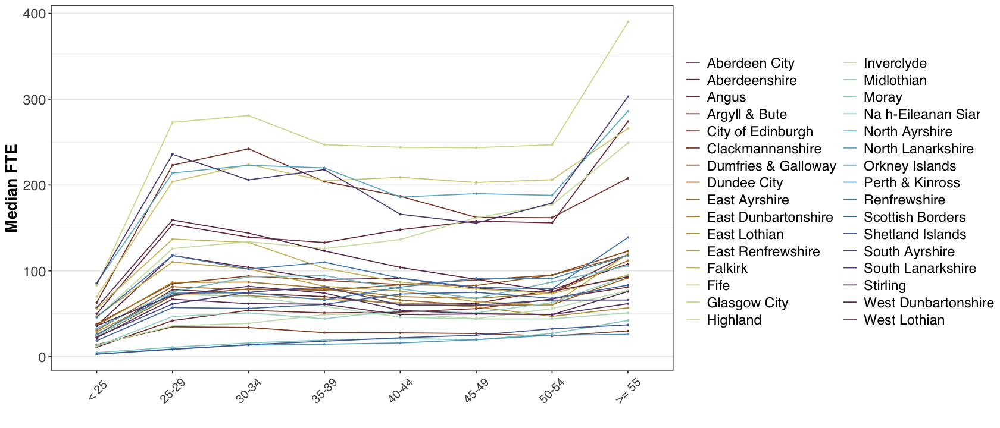

In [36]:
options(repr.plot.width = 14, repr.plot.height = 6)
 
teacher_fte_local_authority_by_age %>%
    filter(Age != "Average") %>%
    group_by(LocalAuthority, Age) %>%
    summarise(across(TeacherFTE, list(median = median, average = mean), na.rm = TRUE)) %>%

    #bind_rows(teacher_fte_local_authority_by_age %>%
    #            filter(Age != "Average") %>%
    #            group_by(Age) %>%
    #            summarise(across(TeacherFTE, list(median = median, average = mean), na.rm = TRUE))
    #) %>%
    ungroup() %>%
    mutate(across(LocalAuthority, ~ fct_explicit_na(., "All LocalAuthorities"))) %>%
    
    ggplot(aes(Age, TeacherFTE_median, colour = LocalAuthority, group = LocalAuthority)) +
        geom_point(size = 0.5, show.legend = FALSE) +
        geom_line() + 
        #ggtitle("Median Teacher FTE - LocalAuthoritys within Group") + 
        ylab("Median FTE") + xlab("") + 
        dressCodeTheme +
        #scale_colour_brewer("LocalAuthority", palette = "Dark2") + #, direction = -1) +
        scale_colour_romaO(discrete = TRUE) +
        #scale_fill_tofino(discrete = TRUE, reverse = TRUE) +

        theme(#legend.position = "bottom", 
              legend.title = element_blank(), 
              legend.margin = margin(0),
              axis.text.y = element_text(size = 14), # element_markdown
              axis.text.x = element_text(size = 12, angle = 45, vjust = 0.5),
              )

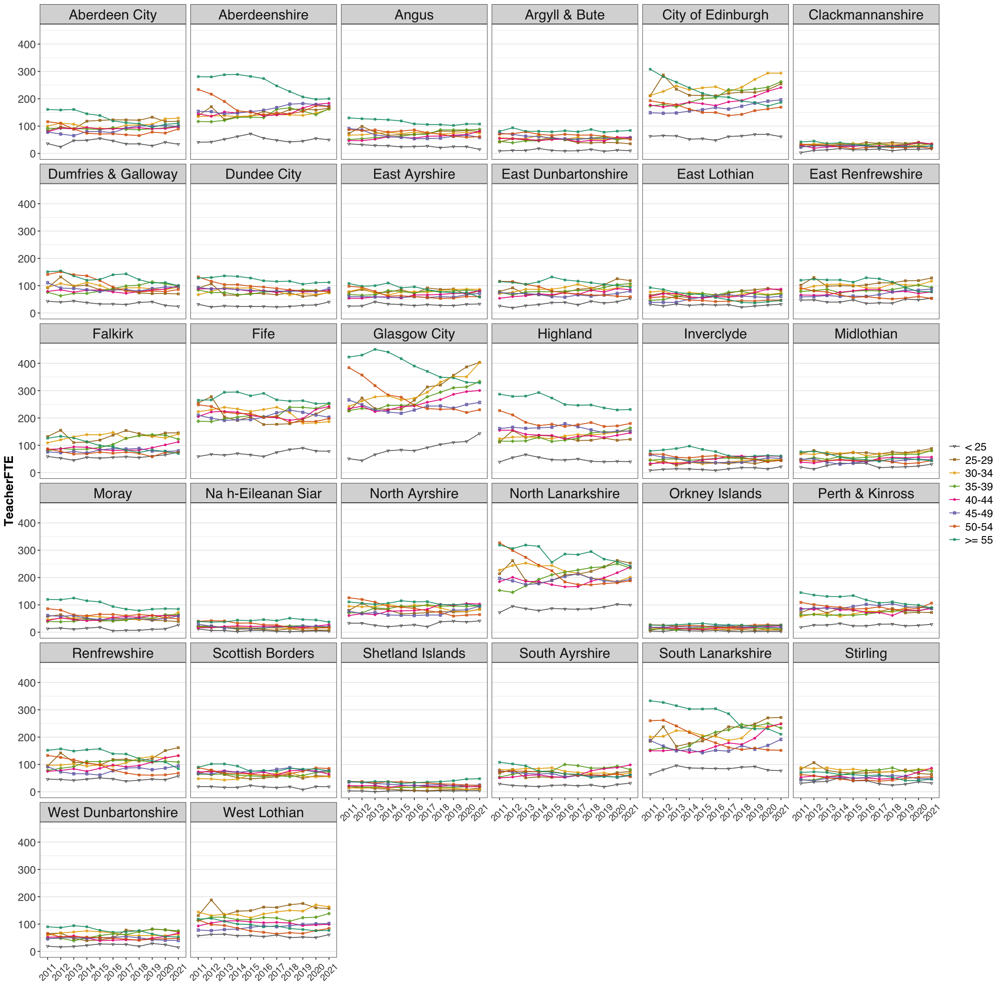

In [37]:
options(repr.plot.width = 18, repr.plot.height = 18)
 
teacher_fte_local_authority_by_age %>%
    filter(Age != "Average") %>%
    
    ggplot(aes(Year, TeacherFTE, colour = Age, group = Age, shape = Age)) +
        geom_point(size = 0.95) +
        geom_line() + 
        #ggtitle("Median Teacher FTE - LocalAuthoritys within Group") + 
        xlab("") + 
        dressCodeTheme +
        #scale_colour_brewer("LocalAuthority", palette = "Dark2") + #, direction = -1) +
        #scale_colour_romaO(discrete = TRUE) +
        #scale_fill_tofino(discrete = TRUE, reverse = TRUE) + 
        scale_colour_brewer(palette = "Dark2", direction =  -1) + 
        scale_shape_manual(values = seq(6, 14)) +

        theme(#legend.position = "bottom", 
              legend.title = element_blank(), 
              legend.margin = margin(0),
              axis.text.y = element_text(size = 14), # element_markdown
              axis.text.x = element_text(size = 12, angle = 45, vjust = 0.5),
              ) +
        facet_wrap(~ LocalAuthority)

`summarise()` has grouped output by 'Year'. You can override using the `.groups` argument.


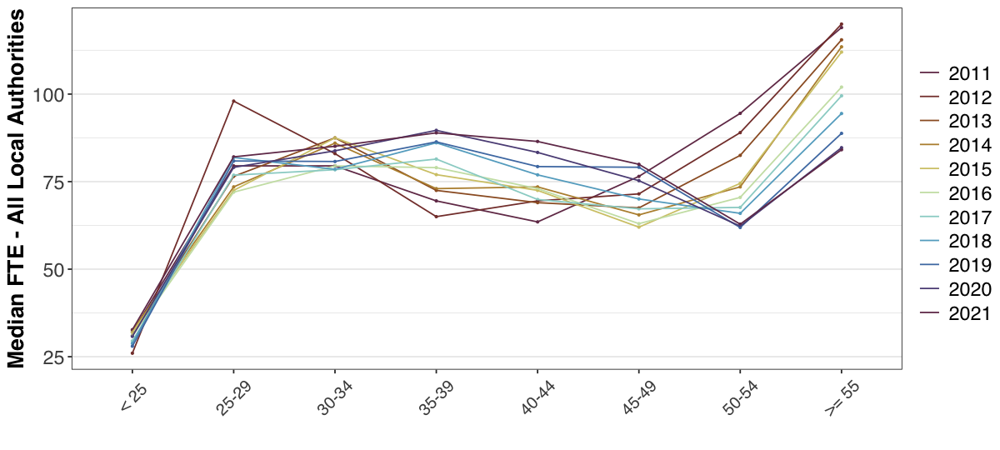

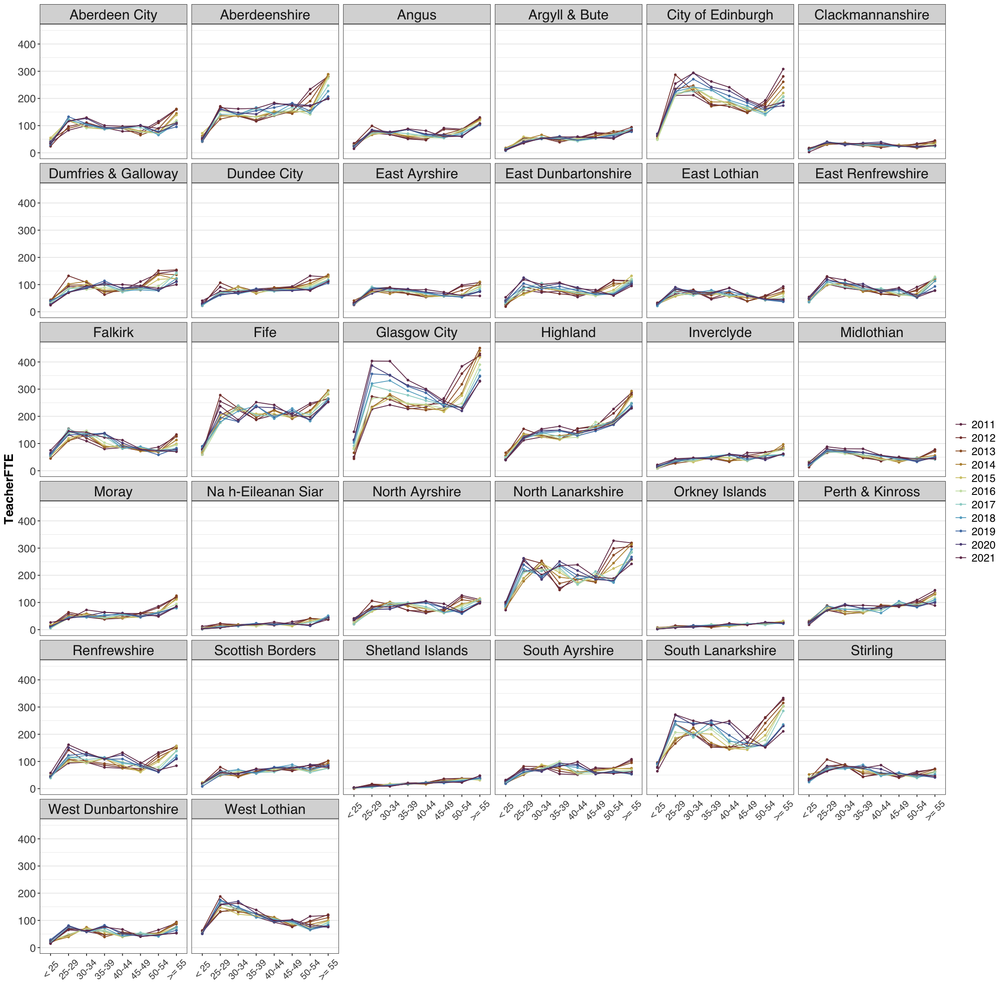

In [38]:
options(repr.plot.width = 10, repr.plot.height = 4.5)

teacher_fte_local_authority_by_age %>%
    filter(Age != "Average") %>%
    group_by(Year, Age) %>%
    summarise(across(TeacherFTE, list(median = median, average = mean), na.rm = TRUE)) %>%

    ungroup() %>%
    mutate(across(Year, ~ fct_explicit_na(., "All LocalAuthorities"))) %>%
    
    ggplot(aes(Age, TeacherFTE_median, colour = Year, group = Year)) +
        geom_point(size = 0.5, show.legend = FALSE) +
        geom_line() + 
        ylab("Median FTE - All Local Authorities") + xlab("") + 
        dressCodeTheme +
        #scale_colour_brewer("Year", palette = "Dark2") + #, direction = -1) +
        scale_colour_romaO(discrete = TRUE) +
        #scale_fill_tofino(discrete = TRUE, reverse = TRUE) +

        theme(#legend.position = "bottom", 
              legend.title = element_blank(), 
              legend.margin = margin(0),
              axis.text.y = element_text(size = 14), # element_markdown
              axis.text.x = element_text(size = 12, angle = 45, vjust = 0.5),
              ) 

options(repr.plot.width = 18, repr.plot.height = 18)
 
teacher_fte_local_authority_by_age %>%
    filter(Age != "Average") %>%
    
    ggplot(aes(Age, TeacherFTE, colour = Year, group = Year)) +
        geom_point(size = 0.95) +
        geom_line() + 
        #ggtitle("Median Teacher FTE - LocalAuthoritys within Group") + 
        xlab("") + 
        dressCodeTheme +
        #scale_colour_brewer("LocalAuthority", palette = "Dark2") + #, direction = -1) +
        scale_colour_romaO(discrete = TRUE) +
        scale_shape_manual(values = seq(6, 14)) +

        theme(#legend.position = "bottom", 
              legend.title = element_blank(), 
              legend.margin = margin(0),
              axis.text.y = element_text(size = 14), # element_markdown
              axis.text.x = element_text(size = 12, angle = 45, vjust = 0.5),
              ) +
        facet_wrap(~ LocalAuthority)

#### <span style = "color:maroon">Teachers Demographics &ndash; gender</span>

In [39]:
tmp <- read_excel("../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2010.xls",
                           sheet = "Table 8.1", col_types =  "text", trim_ws = T, skip = 2) %>%

    filter(rowSums(is.na(.)) != ncol(.)) %>%
    select_if(~ !all(is.na(.)))


names(tmp)


    if (sum(str_detect(names(tmp), "^Female|Male")) != 2) {
        print("found")
        
        tmp <- data.frame(Year = str_match(teacher_census_datafiles[!sel_idx][[1]], "\\d{4}")[, 1],
                          LocalAuthority = NA_character_,
                          FTE_Female = NA_character_,
                          FTE_Male = NA_character_,
                          FTE_Total = NA_character_
                         )
        print(tmp)
    } 
#    else {

        tmp %>%
            rename(LocalAuthority = num_range("...", 1:1)) %>%
            rename_with(~ paste0("FTE_", .), last_col(2):last_col()) %>%

            select(matches("LocalAuthority|FTE_")) %>%
            #rename_with(~ str_remove_all(., "\\.+\\d+$")) %>%
            mutate(across(LocalAuthority, ~ gsub("\\(\\d+\\)", "", .)),
                   across(where(is.character), ~ str_squish(.))
                   ) %>%

            mutate(Year = str_match("../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2011.xls", "\\d{4}")[, 1]) %>%
            relocate(Year, everything()) %>%
            filter(!(str_detect(LocalAuthority, "All local authorities") | 
                     if_all(!c(Year, LocalAuthority), is.na))
                   ) %>%
            glimpse()
#    }
        
tmp %>%
    glimpse()

names(tmp)

New names:
* `` -> ...1
* `` -> ...9



[1] "...1" "2003" "2004" "2005" "2006" "2007" "2008" "2009"

[1] "found"
  Year LocalAuthority FTE_Female FTE_Male FTE_Total
1 2012           <NA>       <NA>     <NA>      <NA>
Rows: 0
Columns: 5
$ Year           <chr> 
$ LocalAuthority <chr> 
$ FTE_FTE_Female <chr> 
$ FTE_FTE_Male   <chr> 
$ FTE_FTE_Total  <chr> 
Rows: 1
Columns: 5
$ Year           <chr> "2012"
$ LocalAuthority <chr> NA
$ FTE_Female     <chr> NA
$ FTE_Male       <chr> NA
$ FTE_Total      <chr> NA


[1] "Year"           "LocalAuthority" "FTE_Female"     "FTE_Male"      
[5] "FTE_Total"

In [40]:
teacher_fte_by_la_and_gender <- data.frame()
glimpse(teacher_fte_by_la_and_gender)


for (i in seq_along(teacher_census_datafiles[sel_idx])) {

    print(paste("Parsing file: ", teacher_census_datafiles[sel_idx][[i]], " ..."))

    
    tmp <- read_excel(teacher_census_datafiles[sel_idx][[i]],
                           sheet = "Table 8.1", col_types =  "text", trim_ws = T, skip = 2) %>%

                    filter(rowSums(is.na(.)) != ncol(.)) %>%
                    select_if(~ !all(is.na(.)))
    
    if (sum(str_detect(names(tmp), "^Female|Male")) != 2) {
        
        tmp <- data.frame(Year = str_match(teacher_census_datafiles[sel_idx][[i]], "\\d{4}")[, 1],
                          LocalAuthority = NA_character_,
                          FTE_Female = NA_character_,
                          FTE_Male = NA_character_,
                          FTE_Total = NA_character_
                         )
        print("Dataset empty or incomplete!")
    } 
    else {

        tmp <- tmp %>%
            rename(LocalAuthority = num_range("...", 1:1)) %>%
            rename_with(~ paste0("FTE_", .), last_col(2):last_col()) %>%

            select(matches("LocalAuthority|FTE_")) %>%
            mutate(across(LocalAuthority, ~ gsub("\\(\\d+\\)", "", .)),
                   across(where(is.character), ~ str_squish(.)),
                   Year = str_match(teacher_census_datafiles[sel_idx][[i]], "\\d{4}")[, 1],
                  ) %>%
            relocate(Year, everything()) %>%
            filter(!(str_detect(LocalAuthority, "All local authorities") | 
                     if_all(!c(Year, LocalAuthority), is.na))
                   )
    }

    teacher_fte_by_la_and_gender <- teacher_fte_by_la_and_gender %>%
        bind_rows(tmp) 
    
    teacher_fte_by_la_and_gender %>%
        nrow() %>%
        print()

}


for (i in seq_along(teacher_census_datafiles[!sel_idx])) {

    print(paste("Parsing file: ", teacher_census_datafiles[!sel_idx][[i]], " ..."))

    
    tmp <- read_excel(teacher_census_datafiles[!sel_idx][[i]],
                           sheet = "Table 8.1", col_types =  "text", trim_ws = T, skip = 3) %>%

                    filter(rowSums(is.na(.)) != ncol(.)) %>%
                    select_if(~ !all(is.na(.)))
    
    
    if (sum(str_detect(names(tmp), "^Female|Male")) != 2) {
        
        tmp <- data.frame(Year = str_match(teacher_census_datafiles[!sel_idx][[i]], "\\d{4}")[, 1],
                          LocalAuthority = NA_character_,
                          FTE_Female = NA_character_,
                          FTE_Male = NA_character_,
                          FTE_Total = NA_character_
                         )
        print("Dataset empty or incomplete!")
    } 
    else {

        tmp <- tmp %>%
            rename(LocalAuthority = num_range("...", 1:1)) %>%
            rename_with(~ paste0("FTE_", .), last_col(2):last_col()) %>%

            select(matches("LocalAuthority|FTE_")) %>%
            mutate(across(LocalAuthority, ~ gsub("\\(\\d+\\)", "", .)),
                   across(where(is.character), ~ str_squish(.)),
                   Year = str_match(teacher_census_datafiles[!sel_idx][[i]], "\\d{4}")[, 1],
                  ) %>%
            relocate(Year, everything()) %>%
            filter(!(str_detect(LocalAuthority, "All local authorities") | 
                     if_all(!c(Year, LocalAuthority), is.na))
                   )
    }


    teacher_fte_by_la_and_gender <- teacher_fte_by_la_and_gender %>%
        bind_rows(tmp) 
    
    teacher_fte_by_la_and_gender %>%
        nrow() %>%
        print()

}

teacher_fte_by_la_and_gender %>%
    glimpse()

rm(tmp)



Rows: 0
Columns: 0
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2010.xls  ..."


New names:
* `` -> ...1
* `` -> ...9



[1] "Dataset empty or incomplete!"
[1] 1
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2011.xls  ..."


New names:
* `` -> ...1
* `` -> ...9



[1] 34
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2012.xls  ..."


New names:
* `` -> ...1
* `` -> ...10



[1] 67
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2013.xls  ..."


New names:
* `` -> ...1
* `` -> ...11



[1] 100
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2014.xls  ..."


New names:
* `` -> ...1
* `` -> ...12



[1] "Dataset empty or incomplete!"
[1] 101
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2015.xls  ..."


New names:
* `` -> ...1
* `` -> ...13



[1] 134
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2016.xls  ..."


New names:
* `` -> ...1
* `` -> ...14



[1] 167
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2017.xlsx  ..."


New names:
* `` -> ...1
* `` -> ...15



[1] 200
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/teacher_census_2018.xlsx  ..."


New names:
* `` -> ...1
* `` -> ...16



[1] 233
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_2020_3.xlsx  ..."


New names:
* `` -> ...1
* `` -> ...18
* `` -> ...22
* `` -> ...23
* `` -> ...24



[1] 266
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_Supplementary_Statistics_2021.xlsx  ..."


New names:
* `` -> ...1
* `` -> ...19
* `` -> ...23
* `` -> ...24
* `` -> ...25



[1] 299
[1] "Parsing file:  ../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_Supplmentary_Tables_2019.xlsx  ..."


New names:
* `` -> ...1
* `` -> ...17
* `` -> ...21
* `` -> ...22
* `` -> ...23



[1] 332
Rows: 332
Columns: 5
$ Year           <chr> "2010", "2011", "2011", "2011", "2011", "2011", "2011",…
$ LocalAuthority <chr> NA, "Aberdeen City", "Aberdeenshire", "Angus", "Argyll …
$ FTE_Female     <chr> NA, "488", "833", "368", "247", "147", "465", "454", "3…
$ FTE_Male       <chr> NA, "256", "411", "213", "185", "74", "322", "262", "22…
$ FTE_Total      <chr> NA, "744", "1258", "581", "432", "221", "786", "716", "…


In [41]:
teacher_fte_by_la_and_gender %>%
    group_by(Year) %>%
    slice_sample(n = 1) %>%
    ungroup() %>%

    mutate(across(Year, as.ordered),
           across(matches("FTE_"), as.double)
          )

teacher_fte_by_la_and_gender %>%
    distinct(LocalAuthority)

Year,LocalAuthority,FTE_Female,FTE_Male,FTE_Total
<ord>,<chr>,<dbl>,<dbl>,<dbl>
2010,NA,NA,NA,NA
2011,Grant aided,32.00,19.00,51.00
2012,Argyll & Bute,240.00,199.00,439.00
2013,East Ayrshire,342.00,210.00,552.00
2014,NA,NA,NA,NA
2015,Grant aided,31.00,21.00,52.00
2016,Argyll & Bute,241.00,182.00,423.00
2017,Moray,269.63,128.88,398.51
2018,Na h-Eileanan Siar,102.17,55.12,157.29


LocalAuthority
<chr>
NA
Aberdeen City
Aberdeenshire
Angus
Argyll & Bute
Clackmannanshire
Dumfries & Galloway
Dundee City
East Ayrshire


In [42]:
teacher_fte_by_la_and_gender <- teacher_fte_by_la_and_gender %>%
    mutate(across(Year, as.ordered),
           across(matches("FTE_"), as.double),

           across(LocalAuthority, as.character),
           across(LocalAuthority, ~ case_when(str_detect(., "Edinburgh") ~ "City of Edinburgh", 
                                              str_detect(., "Eilean") ~ "Na h-Eileanan Siar",
                                              str_detect(., regex("grant aided", ignore_case = TRUE)) ~ "Grant Aided",
                                              TRUE ~ .
                                             )),

           across(LocalAuthority, ~ gsub("\\band\\b", "\\&", .)),
           across(LocalAuthority, as.factor),
           across(LocalAuthority, ~ fct_relevel(., "Grant Aided", after = Inf))
          ) 

levels(teacher_fte_by_la_and_gender$LocalAuthority)
length(levels(teacher_fte_by_la_and_gender$LocalAuthority))

glimpse(teacher_fte_by_la_and_gender)

[1] "Aberdeen City"       "Aberdeenshire"       "Angus"              
 [4] "Argyll & Bute"       "City of Edinburgh"   "Clackmannanshire"   
 [7] "Dumfries & Galloway" "Dundee City"         "East Ayrshire"      
[10] "East Dunbartonshire" "East Lothian"        "East Renfrewshire"  
[13] "Falkirk"             "Fife"                "Glasgow City"       
[16] "Highland"            "Inverclyde"          "Midlothian"         
[19] "Moray"               "Na h-Eileanan Siar"  "North Ayrshire"     
[22] "North Lanarkshire"   "Orkney Islands"      "Perth & Kinross"    
[25] "Renfrewshire"        "Scottish Borders"    "Shetland Islands"   
[28] "South Ayrshire"      "South Lanarkshire"   "Stirling"           
[31] "West Dunbartonshire" "West Lothian"        "Grant Aided"

[1] 33

Rows: 332
Columns: 5
$ Year           <ord> 2010, 2011, 2011, 2011, 2011, 2011, 2011, 2011, 2011, 2…
$ LocalAuthority <fct> NA, Aberdeen City, Aberdeenshire, Angus, Argyll & Bute,…
$ FTE_Female     <dbl> NA, 488, 833, 368, 247, 147, 465, 454, 346, 392, 291, 4…
$ FTE_Male       <dbl> NA, 256, 411, 213, 185, 74, 322, 262, 221, 219, 178, 24…
$ FTE_Total      <dbl> NA, 744, 1258, 581, 432, 221, 786, 716, 567, 611, 469, …


#### <span style = "color:maroon">Teachers Demographics &ndash; Pupil teacher ratio</span>

In [43]:
pupil_teacher_ratios <- read_excel("../sta_it_402/data/demographic_data/teacher_censuses/Teacher_Census_Supplementary_Statistics_2021.xlsx",
                           sheet = "Table 8.2", trim_ws = T, skip = 2) %>%

    filter(rowSums(is.na(.)) != ncol(.)) %>%
    select_if(~ !all(is.na(.)))


pupil_teacher_ratios <- pupil_teacher_ratios %>%
    rename(LocalAuthority = num_range("...", 1:1)) %>%
    pivot_longer(!LocalAuthority, names_to = "Year", values_to = "PupilTeacherRatio") %>% 
    mutate(across(c(Year, LocalAuthority), ~ gsub("\\(\\d+\\)", "", .)),
           across(where(is.character), ~ str_squish(.)),
           
           across(LocalAuthority, ~ case_when(str_detect(., "Edinburgh") ~ "City of Edinburgh", 
                                              str_detect(., "Eilean") ~ "Na h-Eileanan Siar",
                                              str_detect(., regex("grant aided", ignore_case = TRUE)) ~ "Grant Aided",
                                              TRUE ~ .
                                             )),

           across(LocalAuthority, ~ gsub("\\band\\b", "\\&", .)),
           across(LocalAuthority, as.factor),
           across(LocalAuthority, ~ fct_relevel(., "Grant Aided", after = Inf)),
           
           across(Year, as.ordered)
           )

pupil_teacher_ratios <- pupil_teacher_ratios %>%
    group_by(LocalAuthority) %>%
    filter(!if_all(PupilTeacherRatio, is.na)) %>%
    ungroup()

pupil_teacher_ratios %>%
    slice_sample(n = 2)

New names:
* `` -> ...1



LocalAuthority,Year,PupilTeacherRatio
<fct>,<ord>,<dbl>
East Lothian,2018,12.6124
Glasgow City,2010,12.6000


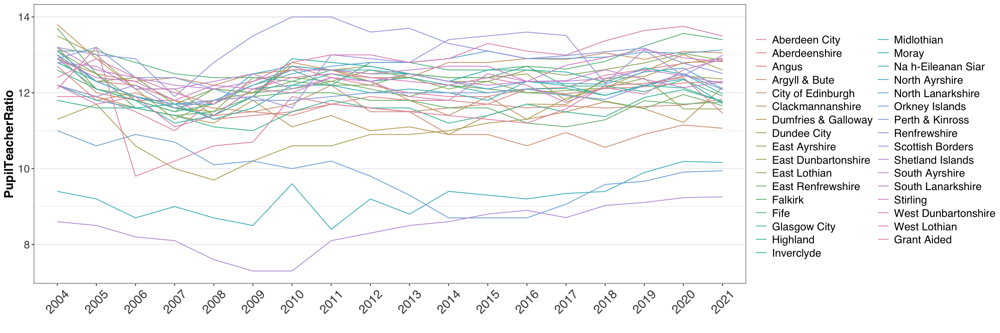

In [44]:
options(repr.plot.width = 18, repr.plot.height = 6)

pupil_teacher_ratios %>%
    filter(LocalAuthority != "All local authorities") %>%
    
    ggplot(aes(Year, PupilTeacherRatio, colour = LocalAuthority, group = LocalAuthority)) +
        geom_line() + 
        xlab("") + 
        dressCodeTheme +
        scale_colour_manual(values = #inferno(33)) +
            #colorRampPalette(brewer.pal(8, "Set2"))(33)) + 
            colorspace::rainbow_hcl(33)) + #, h = c(246, 40), c = 96, l = c(65, 90))) + 
        theme(#legend.position = "bottom", 
              legend.title = element_blank(), 
              legend.margin = margin(0),
              axis.text.y = element_text(size = 14), # element_markdown
              axis.text.x = element_text(size = 16, angle = 45, vjust = 0.5),
              ) 



In [45]:
teacher_census %>%
    distinct(SubjectGroup)

n_distinct(teacher_census$Subject)

SubjectGroup
<fct>
English
ModernLanguages
OtherEnglish
NA
Maths
Sciences
ModernStudies
ReligiousAndMoralEducation
Computing


[1] 39

In [46]:
teacher_fte_main_subject_by_age %>%
    filter((Subject == "English") & (Year == 2011)) %>%
    summarise(across(TeacherFTE, sum, na.rm = TRUE))

teacher_fte_main_subject_by_la_and_gender %>%
    filter((Subject == "English") & (Year == 2011))


teacher_census %>%
    filter((Subject == "English") & (Year == 2011)) %>%
    summarise(across(TeacherFTE, sum, na.rm = TRUE))

TeacherFTE
<dbl>
2717


Year,Subject,SubjectGroup,CommonSubjectLabel,MainSubjectFemale,MainSubjectMale,MainSubjectTotal,OtherSubjectFemale,OtherSubjectMale,OtherSubjectTotal
<chr>,<fct>,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
2011,English,English,English,1952,725,2678,2102,766,2868


TeacherFTE
<dbl>
2677


### <span style = "color:maroon">CS Teachers FTE 2016-2020 - FOI request</span>

In [47]:
cs_teacher_census_foi_2016_2020 <- read_csv("../sta_it_402/data/demographic_data/teacher_censuses//CS-teachers-FOI-responses_2016_2020.csv")

glimpse(cs_teacher_census_foi_2016_2020)

New names:
* `` -> ...9

Rows: 714 Columns: 9
── Column specification ──────────────────────────────────────────────────────────
Delimiter: ","
chr (4): Local Authority, School Name, School Type, ...9
dbl (5): SeedCode, Latitude, Longitude, FOI-Year, FTE

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Rows: 714
Columns: 9
$ `Local Authority` <chr> "Aberdeen City", "Aberdeen City", "Aberdeen City", "…
$ SeedCode          <dbl> 5244439, 5235634, 5234034, 5235839, 5243335, 5243238…
$ `School Name`     <chr> "Aberdeen Grammar School", "Bridge of Don Academy", …
$ Latitude          <dbl> 57.14694, 57.18477, 57.17737, 57.11836, 57.20573, 57…
$ Longitude         <dbl> -2.115947, -2.111086, -2.182532, -2.190152, -2.17595…
$ `School Type`     <chr> "Secondary", "Secondary", "Secondary", "Secondary", …
$ `FOI-Year`        <dbl> 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016…
$ FTE               <dbl> 2.00, 0.56, 1.00, 2.00, 2.00, 1.00, 0.00, 2.00, 1.00…
$ ...9              <chr> NA, NA, NA, NA, NA, NA, NA, "Torry and Kincorth", NA…


In [48]:
cs_teacher_census_foi_2016_2020 <- cs_teacher_census_foi_2016_2020 %>%
    rename_with(~ "SchoolNameOld", matches("\\.+\\d+")) %>%
    rename_with(~ snakecase::to_upper_camel_case(., abbreviations = c("ASN", "PSE", "FOI", "FTE"))) %>%
    rename(TeacherFTE = FTE) %>%
    
    mutate(across(where(is.character), ~ str_squish(.)),
           
           across(LocalAuthority, ~ gsub("\\band\\b", "\\&", .)),
           across(LocalAuthority, ~ if_else(str_detect(., regex("grant aided", ignore_case = TRUE)), "Grant Aided", .)),
                                              
           Subject = "Computing",
           
           across(c(LocalAuthority, SeedCode, SchoolType, Subject), as.factor),
           across(LocalAuthority, ~ fct_relevel(., "Grant Aided", after = Inf)),
           across(FOIYear, as.ordered),
          ) %>%
    relocate(Subject, .after = TeacherFTE) %>%

    glimpse()

levels(cs_teacher_census_foi_2016_2020$LocalAuthority)
n_distinct(cs_teacher_census_foi_2016_2020$SeedCode)
levels(cs_teacher_census_foi_2016_2020$SchoolType)

Rows: 714
Columns: 10
$ LocalAuthority <fct> Aberdeen City, Aberdeen City, Aberdeen City, Aberdeen C…
$ SeedCode       <fct> 5244439, 5235634, 5234034, 5235839, 5243335, 5243238, 5…
$ SchoolName     <chr> "Aberdeen Grammar School", "Bridge of Don Academy", "Bu…
$ Latitude       <dbl> 57.14694, 57.18477, 57.17737, 57.11836, 57.20573, 57.14…
$ Longitude      <dbl> -2.115947, -2.111086, -2.182532, -2.190152, -2.175952, …
$ SchoolType     <fct> Secondary, Secondary, Secondary, Secondary, Secondary, …
$ FOIYear        <ord> 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2…
$ TeacherFTE     <dbl> 2.00, 0.56, 1.00, 2.00, 2.00, 1.00, 0.00, 2.00, 1.00, 1…
$ Subject        <fct> Computing, Computing, Computing, Computing, Computing, …
$ SchoolNameOld  <chr> NA, NA, NA, NA, NA, NA, NA, "Torry and Kincorth", NA, N…


[1] "Aberdeen City"       "Aberdeenshire"       "Angus"              
 [4] "Argyll & Bute"       "City of Edinburgh"   "Clackmannanshire"   
 [7] "Dumfries & Galloway" "Dundee City"         "East Ayrshire"      
[10] "East Dunbartonshire" "East Lothian"        "East Renfrewshire"  
[13] "Falkirk"             "Fife"                "Glasgow City"       
[16] "Highland"            "Inverclyde"          "Midlothian"         
[19] "Moray"               "Na h-Eileanan Siar"  "North Ayrshire"     
[22] "North Lanarkshire"   "Orkney Islands"      "Perth & Kinross"    
[25] "Renfrewshire"        "Scottish Borders"    "Shetland Islands"   
[28] "South Ayrshire"      "South Lanarkshire"   "Stirling"           
[31] "West Dunbartonshire" "West Lothian"        "Grant Aided"

[1] 357

[1] "Secondary"

`summarise()` has grouped output by 'FOIYear', 'LocalAuthority', 'SchoolType'. You can override using the `.groups` argument.
Warning message:
“Removed 6 rows containing missing values (geom_segment).”
Warning message:
“Removed 1 rows containing missing values (geom_point).”
Warning message:
“Removed 6 rows containing missing values (geom_point).”


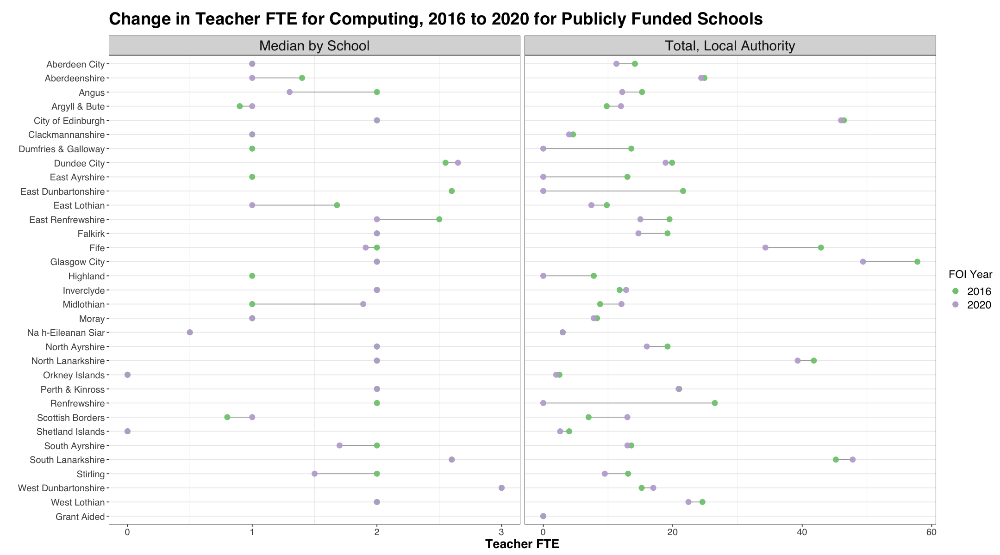

In [49]:
options(repr.plot.width = 18, repr.plot.height = 10)

cs_teacher_census_foi_2016_2020 %>%

    #filter(Subject == "Computing") %>%

    mutate(across(LocalAuthority, ~ fct_rev(.))) %>%
    group_by(FOIYear, LocalAuthority, SchoolType, Subject) %>%
    summarise(across(TeacherFTE, list(total = sum, median = median), na.rm = TRUE, .names = "{.fn}")) %>%

    pivot_wider(names_from = FOIYear, values_from = c(total, median), names_prefix = "FTE_") %>%

    pivot_longer(matches("FTE"), names_to = "metric", values_to = "FTE") %>% # , values_drop_na = TRUE
    separate("metric", c("metric", NA, "FOIYear")) %>%
    mutate(across(metric, as.factor),
           across(FOIYear, ~ as.ordered(as.integer(.))),
           across(metric, ~ fct_recode(., "Total, Local Authority" = "total", "Median by School" = "median"))
          ) %>%

    pivot_wider(names_from = FOIYear, values_from = FTE, names_prefix = "FTE_") %>%

    ggplot(aes(y = LocalAuthority)) +
        geom_segment(aes(x = FTE_2016, xend = FTE_2020, yend = LocalAuthority), alpha = 0.35) +
        geom_point(aes(x = FTE_2016, colour = "2016"), size = 3, alpha = 0.95) +
        geom_point(aes(x = FTE_2020, colour = "2020"), size = 3, alpha = 0.95) +
        #scale_colour_discrete(name = "FOI Year") +
        scale_colour_brewer("FOI Year", palette = "Accent") + #, direction = -1) +
        #khroma::scale_fill_romaO("FOIYear", discrete = TRUE) +
        #scale_x_log10(labels = scales::label_number_si()) + 
        guides(fill = "none") +
        
        ylab("") +
        xlab("Teacher FTE") +
        ggtitle("Change in Teacher FTE for Computing, 2016 to 2020 for Publicly Funded Schools") +
        dressCodeTheme +
        facet_wrap(~ metric, scales = "free_x")

In [50]:
cs_teacher_census_foi_2016_2020 %>%
    pivot_wider(names_from = FOIYear, values_from = TeacherFTE, names_prefix = "FTE_") %>%
    group_by(LocalAuthority) %>%
    tally(name = "NoOfSchools")
    #slice_sample(n = 8)

LocalAuthority,NoOfSchools
<fct>,<int>
Aberdeen City,12
Aberdeenshire,18
Angus,8
Argyll & Bute,10
City of Edinburgh,23
Clackmannanshire,3
Dumfries & Galloway,17
Dundee City,8
East Ayrshire,8


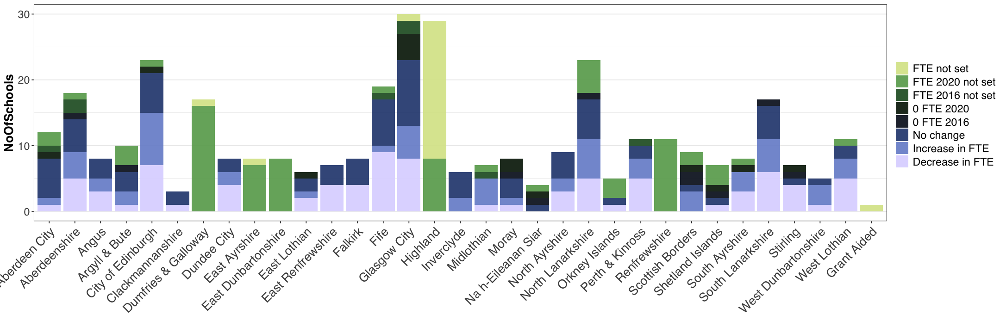

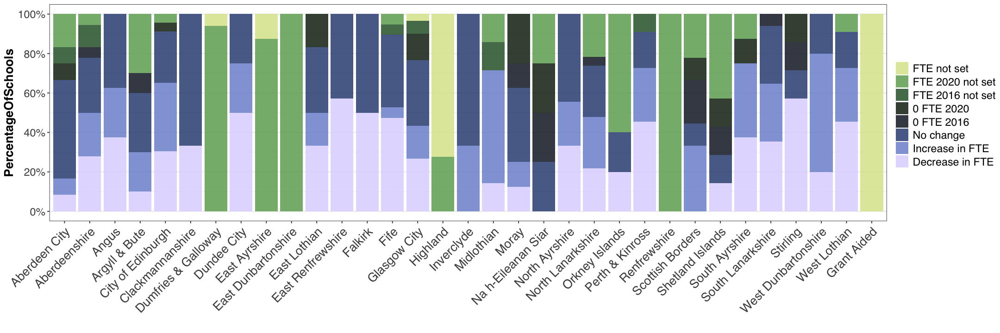

In [51]:
options(repr.plot.width = 18, repr.plot.height = 6)

tmp_df <- cs_teacher_census_foi_2016_2020 %>%

    pivot_wider(names_from = FOIYear, values_from = TeacherFTE, names_prefix = "FTE_") %>%

    mutate(percent_change = (FTE_2020 - FTE_2016) / FTE_2016,
           across(percent_change, ~ case_when(is.na(.) ~ 
                                                  case_when(if_all(matches("FTE_"), is.na) ~ "FTE not set",
                                                            is.na(FTE_2016) ~ "FTE 2016 not set",
                                                            TRUE ~ "FTE 2020 not set"
                                                           ),
                                              (. == Inf) ~ "0 FTE 2016",
                                              (. == - 1) ~ "0 FTE 2020",
                                              (. < 0) ~ "Decrease in FTE",
                                              (. > 0) ~ "Increase in FTE",
                                              TRUE ~ "No change"
                                              ), .names = "change_type"),
           across(change_type, as.factor),
           across(change_type, ~ fct_relevel(., "Decrease in FTE", "Increase in FTE", "No change")),
           across(change_type, ~ fct_rev(.)),
          ) %>%

    group_by(LocalAuthority) %>%
    add_tally(name = "TotalSchools") %>%
    ungroup() %>%

    count(name = "NoOfSchools", LocalAuthority, TotalSchools, change_type) %>%
    mutate(PercentageOfSchools = NoOfSchools / TotalSchools,
           chart_label = scales::percent(PercentageOfSchools)
          )


tmp_df %>%
    
    ggplot(aes(LocalAuthority, NoOfSchools, fill = change_type)) + #, colour = change_type, group = change_type)) +
        geom_bar(stat = "identity", position = "stack", alpha = 0.95) + 
        xlab("") + 
        dressCodeTheme +
        #scale_fill_romaO(discrete = TRUE) +
        scale_fill_tofino(discrete = TRUE, reverse = TRUE) +
        #scale_fill_lisbon(discrete = TRUE, reverse = TRUE) +

                theme(#legend.position = "bottom", 
              legend.title = element_blank(), 
              legend.margin = margin(0),
              axis.text.y = element_text(size = 14), # element_markdown
              axis.text.x = element_text(size = 16, angle = 45, vjust = 0.99, hjust = 1),
              ) 

tmp_df %>%
    
    ggplot(aes(LocalAuthority, PercentageOfSchools, fill = change_type)) + #, colour = change_type, group = change_type)) +
        geom_bar(stat = "identity", position = "stack", alpha = 0.85) + 
        scale_y_continuous(breaks = seq(0, 1, .2), label = percent) +
        #geom_text(aes(label = chart_label), size = 3, position = position_stack(vjust = 0.5)) +
        xlab("") + 
        dressCodeTheme +
        scale_fill_tofino(discrete = TRUE, reverse = TRUE) +
        
        theme(#legend.position = "bottom", 
              legend.title = element_blank(), 
              legend.margin = margin(0),
              axis.text.y = element_text(size = 14), # element_markdown
              axis.text.x = element_text(size = 16, angle = 45, vjust = 0.99, hjust = 1),
              ) 

In [52]:
#left_join(
    cs_teacher_census_foi_2016_2020 %>%

            #filter(Subject == "Computing") %>%

            mutate(across(LocalAuthority, ~ fct_rev(.))) %>%
            group_by(FOIYear, LocalAuthority, SchoolType, Subject) %>%
            summarise(across(TeacherFTE, list(total = sum, median = median), na.rm = TRUE, .names = "{.fn}")) %>%

            pivot_wider(names_from = FOIYear, values_from = c(total, median), names_prefix = "FTE_") %>%

            pivot_longer(matches("FTE"), names_to = "metric", values_to = "FTE") %>% # , values_drop_na = TRUE
            separate("metric", c("metric", NA, "FOIYear")) %>%
            mutate(across(metric, as.factor),
                   across(FOIYear, ~ as.ordered(as.integer(.))),
                   across(metric, ~ fct_recode(., "Total, Local Authority" = "total", "Median by School" = "median"))
                  ) %>%

            pivot_wider(names_from = FOIYear, values_from = FTE, names_prefix = "FTE_LA_")
#          ) #%>%

    #slice_sample(n = 8)

`summarise()` has grouped output by 'FOIYear', 'LocalAuthority', 'SchoolType'. You can override using the `.groups` argument.


LocalAuthority,SchoolType,Subject,metric,FTE_LA_2016,FTE_LA_2020
<fct>,<fct>,<fct>,<fct>,<dbl>,<dbl>
Grant Aided,Secondary,Computing,"Total, Local Authority",0.00,0.00
Grant Aided,Secondary,Computing,Median by School,NA,NA
West Lothian,Secondary,Computing,"Total, Local Authority",24.59,22.43
West Lothian,Secondary,Computing,Median by School,2.00,2.00
West Dunbartonshire,Secondary,Computing,"Total, Local Authority",15.20,17.00
West Dunbartonshire,Secondary,Computing,Median by School,3.00,3.00
Stirling,Secondary,Computing,"Total, Local Authority",13.10,9.50
Stirling,Secondary,Computing,Median by School,2.00,1.50
South Lanarkshire,Secondary,Computing,"Total, Local Authority",45.20,47.80


In [ ]:
***

In [58]:
gender_colour_scheme




levels(teacher_census$SubjectGroup) 
levels(teacher_census$Subject)


levels(select_focus_subjects$SubjectGroup)


female      male 
"#882255" "#117733"

[1] "Computing"                  "ASN"                       
 [3] "English"                    "ExpressiveArt"             
 [5] "HealthAndWellBeing"         "Maths"                     
 [7] "ModernLanguages"            "ModernStudies"             
 [9] "OtherEnglish"               "ReligiousAndMoralEducation"
[11] "Sciences"

[1] "English"                       "French"                       
 [3] "German"                        "Spanish"                      
 [5] "Gaelic"                        "Italian"                      
 [7] "EnglishAsAnAdditionalLanguage" "CommunityLanguages"           
 [9] "OtherModernLanguages"          "Classics"                     
[11] "Mathematics"                   "Biology"                      
[13] "Chemistry"                     "ScienceGeneral"               
[15] "Physics"                       "Economics"                    
[17] "Geography"                     "History"                      
[19] "ReligiousEducation"            "ModernStudies"                
[21] "MediaStudies"                  "BusinessEducation"            
[23] "Computing"                     "HomeEconomics"                
[25] "TechnicalEducation"            "PSEGuidance"                  
[27] "ArtAndDesign"                  "Music"                        
[29] "PhysicalEducation"             "Drama"                        
[31] "LearningSupport"               "ASNGeneral"                   
[33] "ASNBehaviouralSupport"         "ASNLearningDifficulties"      
[35] "ASNPhysicalDisabilities"       "HearingImpairment"            
[37] "VisualImpairment"              "Other"                        
[39] "NotKnown"

[1] "Computing"                  "OtherComputing"            
 [3] "Biotechnology"              "Engineering"               
 [5] "English"                    "ExpressiveArt"             
 [7] "HealthAndWellBeing"         "Maths"                     
 [9] "ModernLanguages"            "ModernStudies"             
[11] "ReligiousAndMoralEducation" "Sciences"                  
[13] "Technological Studies"      "Technology"

In [59]:
n_distinct(select_focus_subjects$SubjectGroup) #- 14 - Computing first
levels(select_focus_subjects$SubjectGroup)
n_distinct(teacher_census$LocalAuthority)# - 33 (icludig grant aided)

teacher_fte_local_authority_by_age %>%
    distinct(Age)

teacher_fte_main_subject_by_age %>%
    distinct(Age)

Age - up to 11 (70+)

month / year

SIMD - 5
RuralUrban - 8

SQA qualifications - 14

grade_groups - 8
grades - up to 7 per group

gender - 
ISO/IEC 5218 are:

0 = Not known;
1 = Male;
2 = Female;
9 = Not applicable
dc-402 order 2, 1, 0, 9
?neutral?

[1] 14

[1] "Computing"                  "OtherComputing"            
 [3] "Biotechnology"              "Engineering"               
 [5] "English"                    "ExpressiveArt"             
 [7] "HealthAndWellBeing"         "Maths"                     
 [9] "ModernLanguages"            "ModernStudies"             
[11] "ReligiousAndMoralEducation" "Sciences"                  
[13] "Technological Studies"      "Technology"

[1] 33

Age
<fct>
< 25
25-29
30-34
35-39
40-44
45-49
50-54
>= 55
Average


Age
<fct>
< 25
25-29
30-34
35-39
40-44
45-49
50-54
55-59
>= 60


LocalAuthority,muted,soil
<fct>,<clr_schm>,<clr_schm>
Aberdeen City,#CC6677,#795F35
Aberdeenshire,#A5557B,#D6A58C
Angus,#7F447F,#F57F77
Argyll & Bute,#593283,#DB3639
Clackmannanshire,#332288,#7F6466
Dumfries & Galloway,#5D4C83,#BEAA89
Dundee City,#88777F,#F7DC6B
East Ayrshire,#B2A17B,#FEEC00
East Dunbartonshire,#DDCC77,#FBCE16


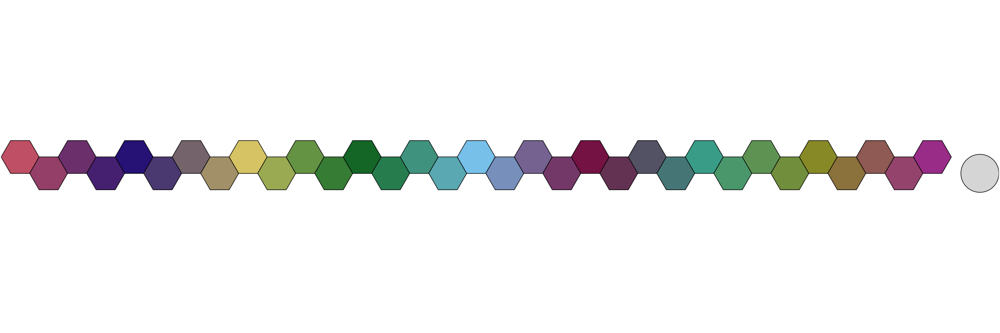

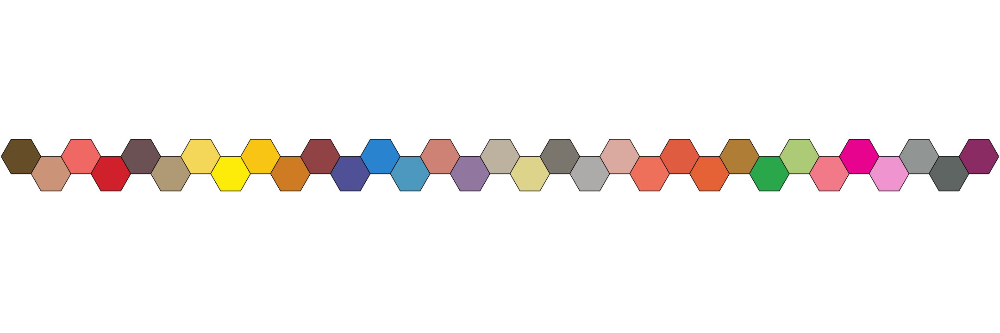

In [82]:

teacher_census %>%
    distinct(LocalAuthority) %>%
    mutate(muted = colour("muted", force = TRUE)(33),
           soil = colour("soil", force = TRUE)(33)
)
plot_scheme(colour("muted", force = TRUE)(33))
plot_scheme(colour("soil", force = TRUE)(33))


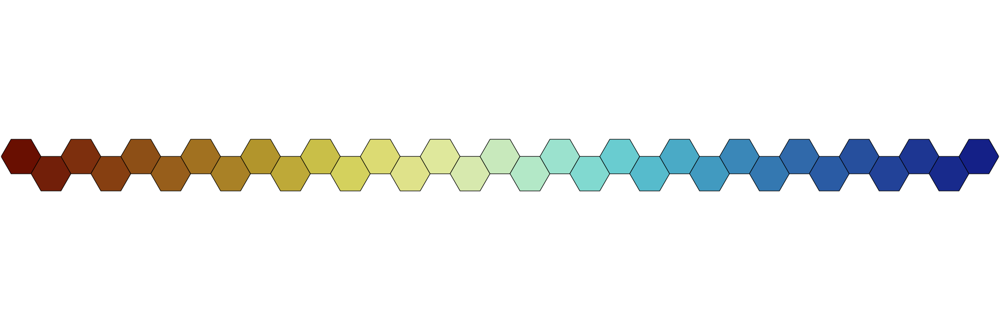

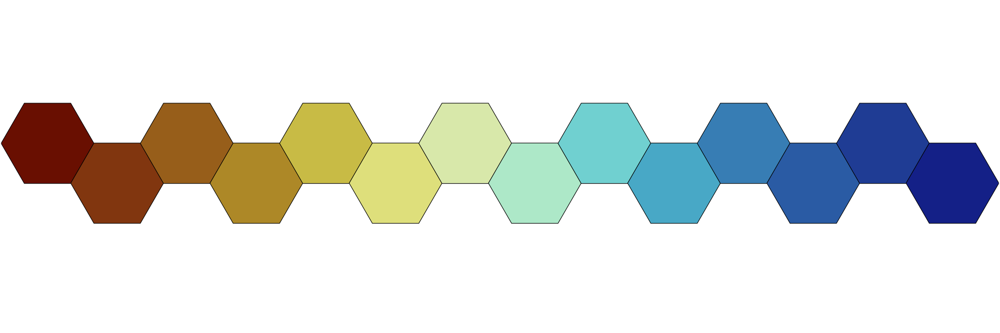

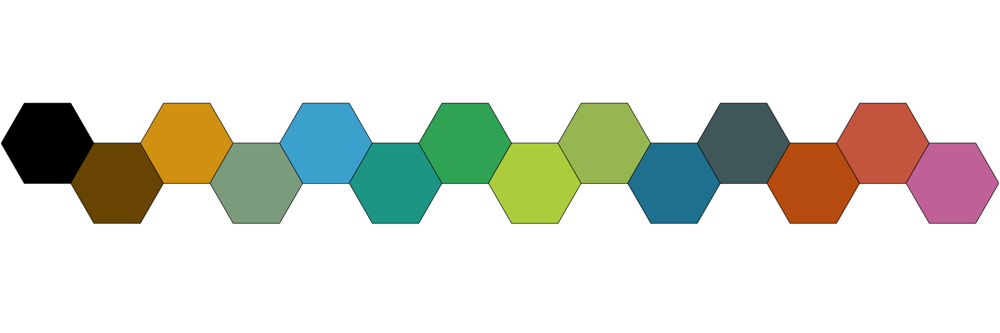

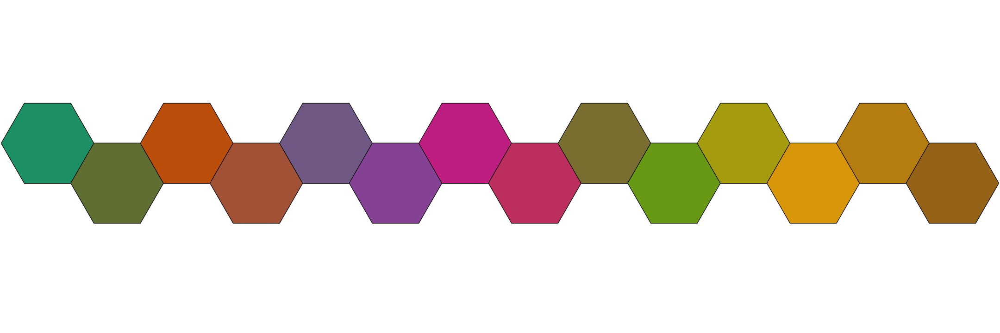

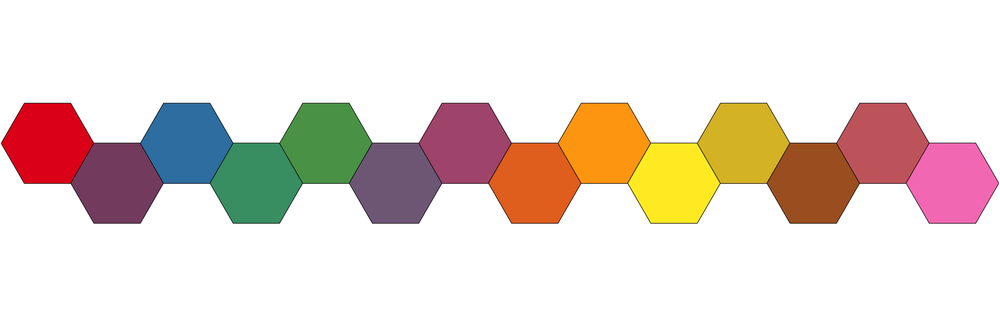

In [83]:

plot_scheme(colour("roma", force = TRUE)(14))
plot_scheme(colour("okabe ito", force = TRUE)(14))

plot_scheme(colorRampPalette(brewer.pal(7, "Dark2"))(14))
plot_scheme(colorRampPalette(brewer.pal(8, "Set1"))(14))



#000000 #E69F00 #56B4E9 #009E73 #F0E442 #0072B2 #D55E00 #CC79A7

#000000 #322200 #644500 #966800 #C98B00 #D8A015 #B9A548 #99AA7B #79AEAE #5AB3E1 #45AFD2 #33ABB9 #20A69F #0DA185 #0FA26F #43B165 #78C15A #ACD04F #E1DF45 #CAD253 #95B96C #61A084 #2C879D #0671AC #356D85 #63685E #926437 #C15F10 #D36114 #D16739 #CF6D5D #CD7382 #CC79A7

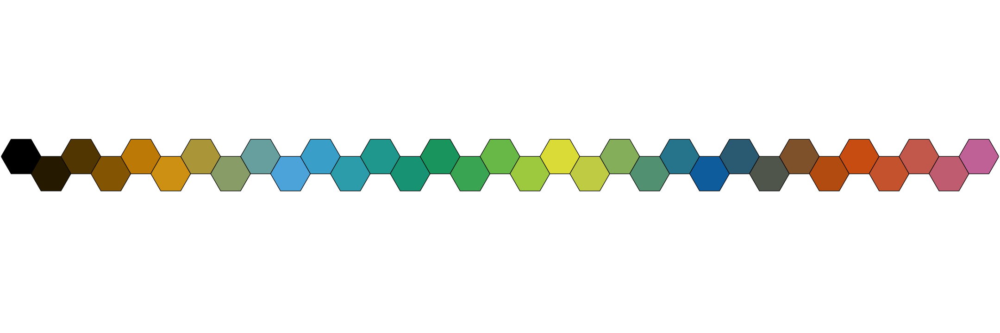

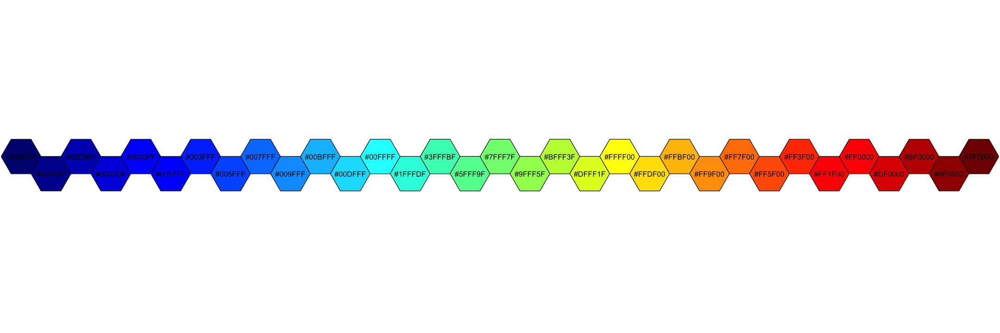

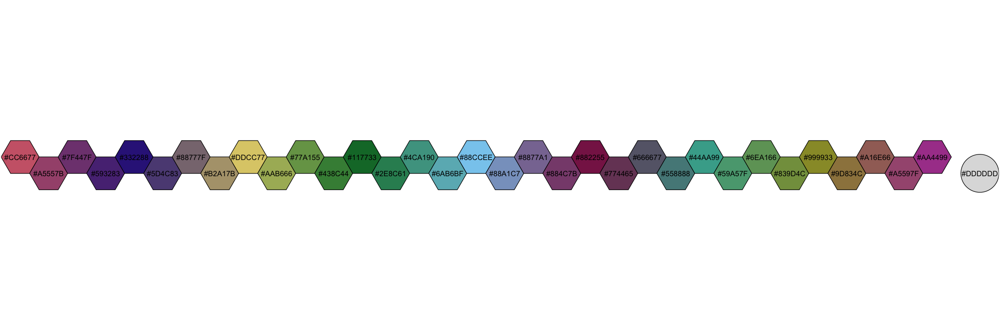

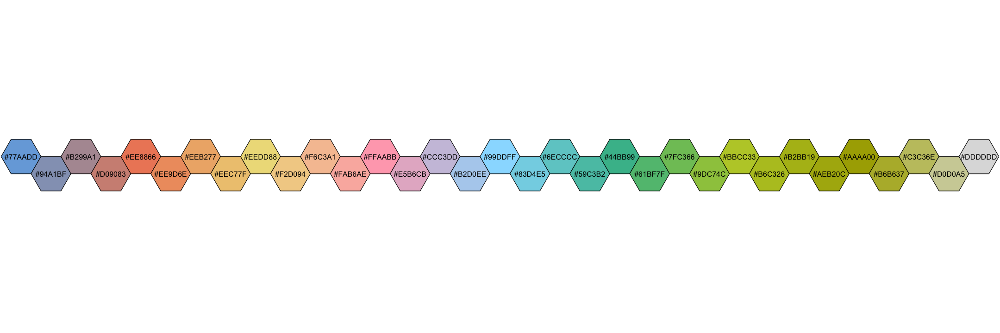

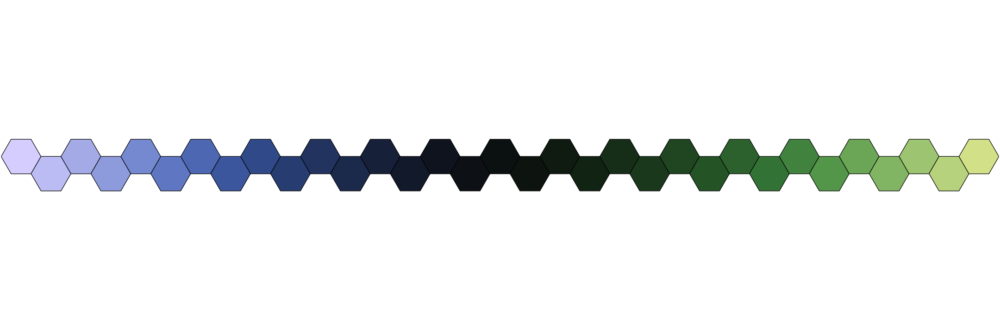

...

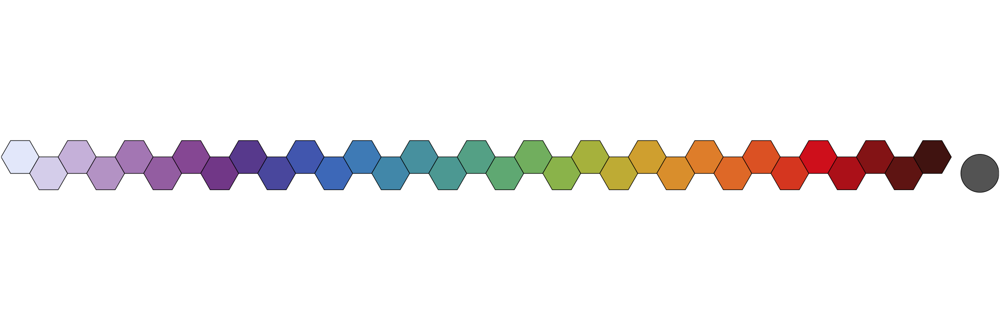

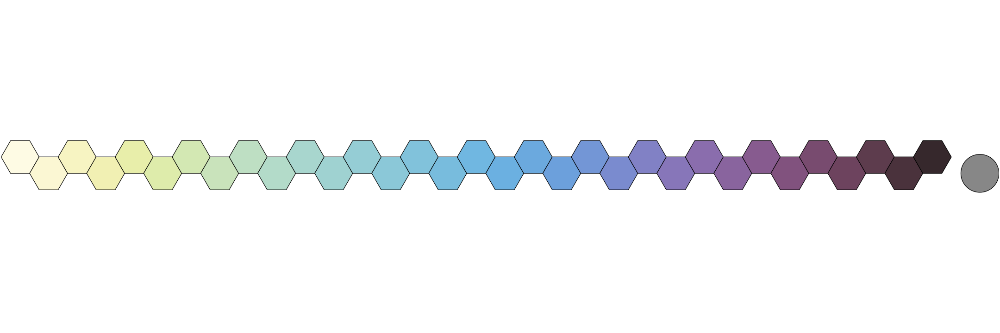

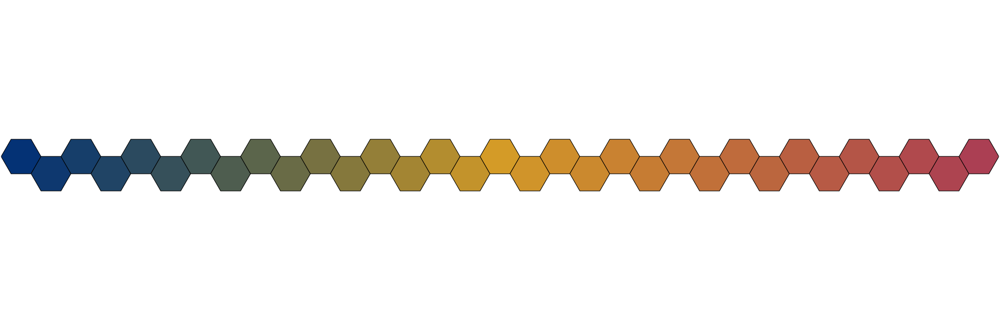

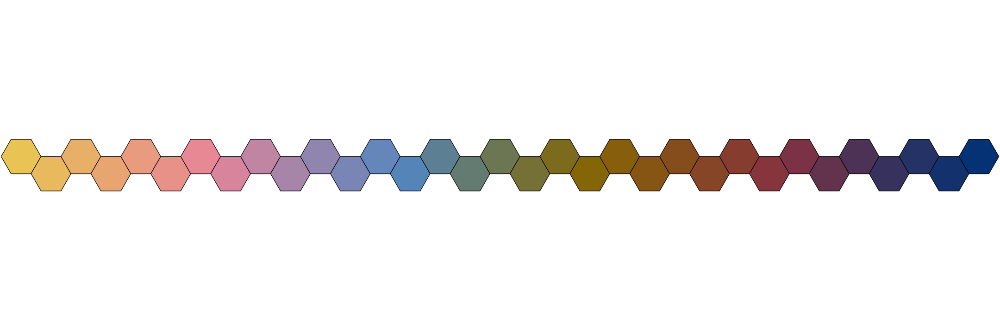

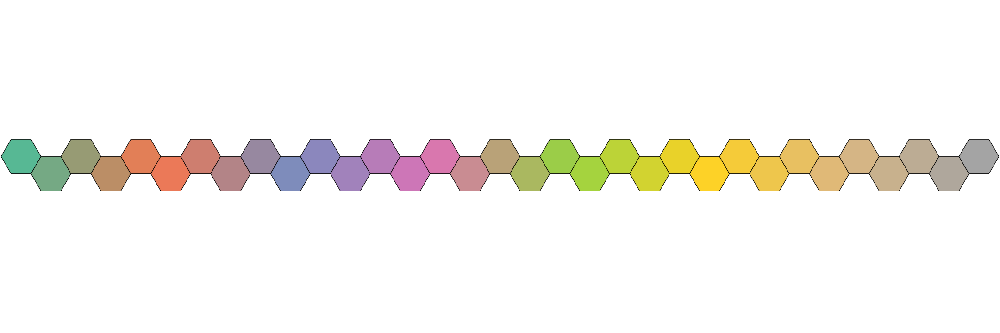

In [61]:
colour("okabe ito")(8)
colour("okabe ito", force = TRUE)(33)
plot_scheme(colour("okabe ito", force = TRUE)(33))
plot_scheme(colorRampPalette(c("#00007F", "blue", "#007FFF", "cyan", "#7FFF7F", "yellow", "#FF7F00", "red", 
                               "#7F0000"))(33), colours = TRUE, names = TRUE, size = 0.8)
#plot_scheme(colorRampPalette(c("red", "orange", "blue"), space = "Lab")(33))
#plot_scheme(colorRampPalette(c("red", "orange", "blue"), space = "rgb")(33))

plot_scheme(colour("muted", force = TRUE)(33), colours = TRUE, names = TRUE, size = 0.8)
plot_scheme(colour("light", force = TRUE)(33), colours = TRUE, names = TRUE, size = 0.8)

plot_scheme(colour("tofino", force = TRUE)(33))
plot_scheme(colour("bukavu", force = TRUE)(33))


#colorRampPalette(brewer.pal(8, "Set2"))(33) 
#colorRampPalette(colour("okabe ito")(8), bias = 25)(33)

#colorRampPalette(colour("stratigraphy")(175))(33)
#colorRampPalette(colour("stratigraphy")(33))(33)

#colour("stratigraphy")(175)
#colour("land")(14)

plot_scheme(colour("stratigraphy", force = TRUE)(33))
plot_scheme(colour("soil", force = TRUE)(33))
plot_scheme(colour("roma", force = TRUE)(33))
plot_scheme(colour("broc", force = TRUE)(33))
plot_scheme(colour("discrete rainbow", force = TRUE)(33))
plot_scheme(colour("smooth rainbow", force = TRUE)(33))
plot_scheme(colour("iridescent", force = TRUE)(33))
plot_scheme(colour("high contrast", force = TRUE)(33))
plot_scheme(colour("medium contrast", force = TRUE)(33))
plot_scheme(colorRampPalette(brewer.pal(8, "Set2"))(33))

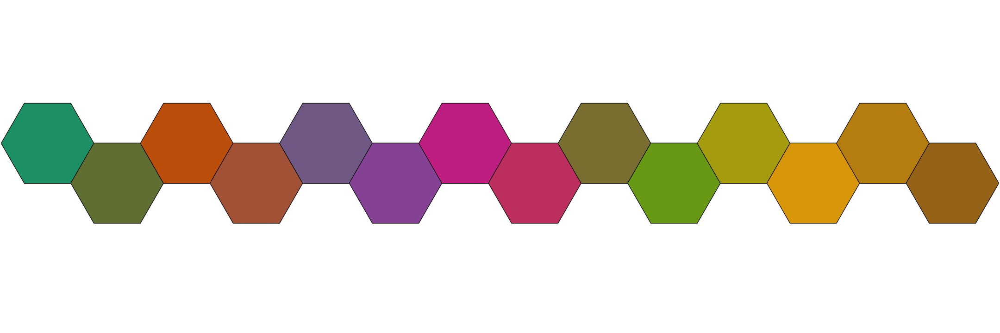

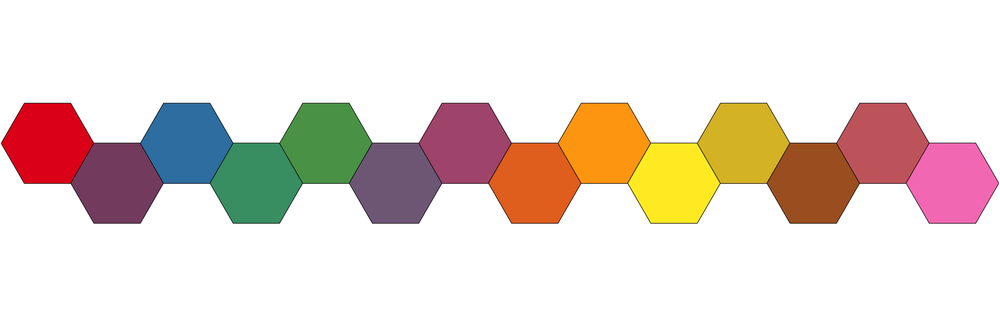

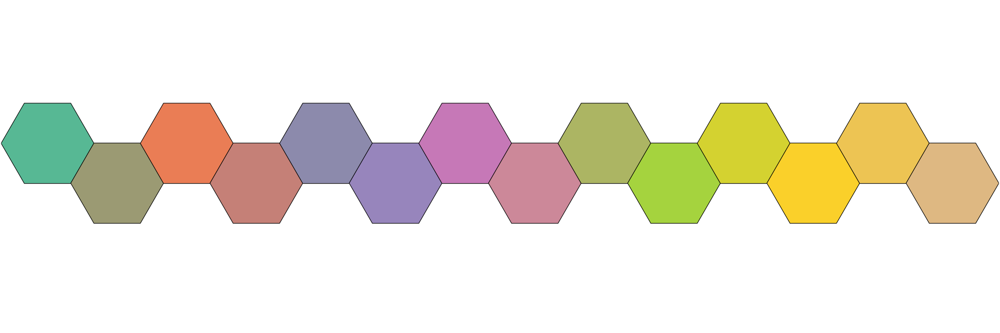

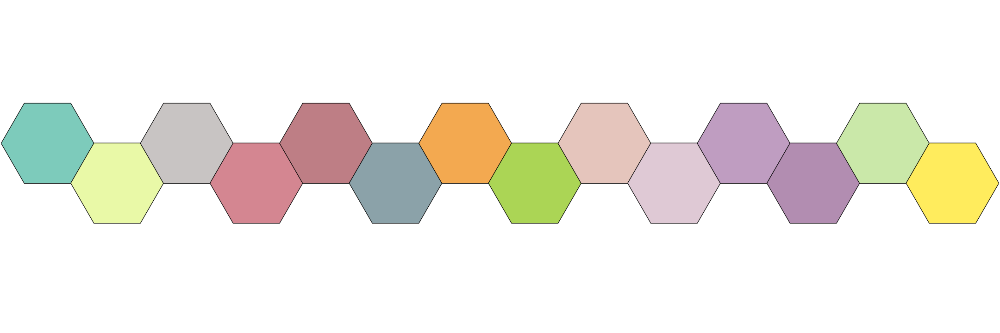

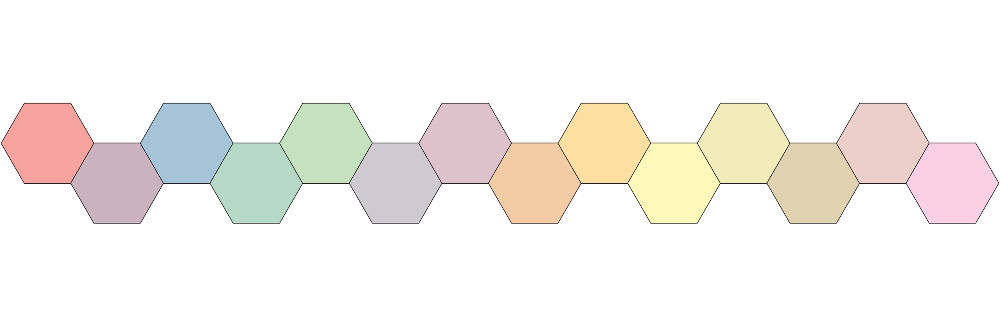

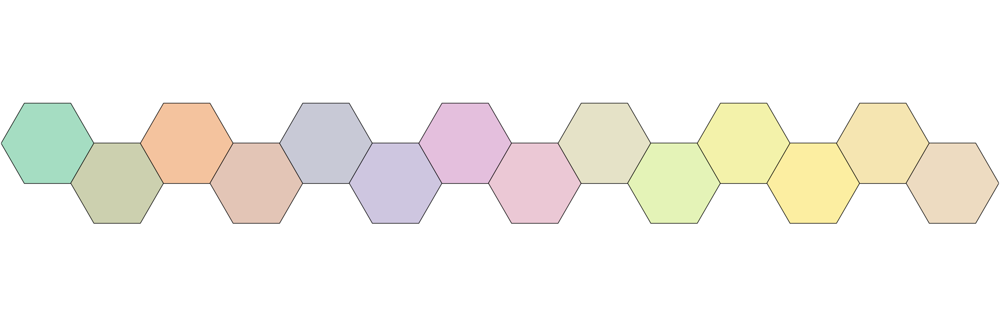

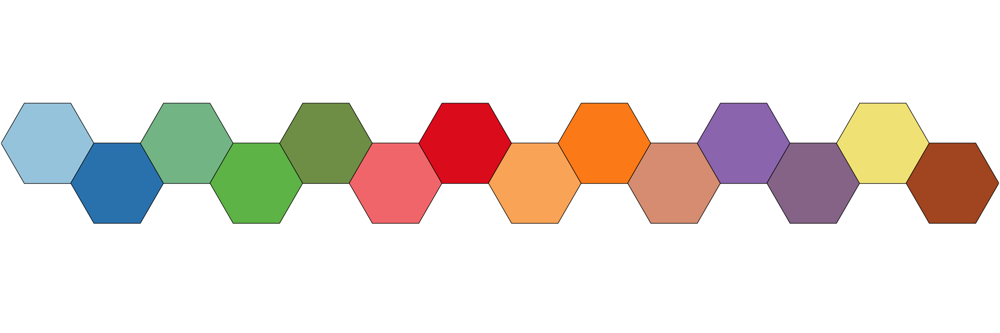

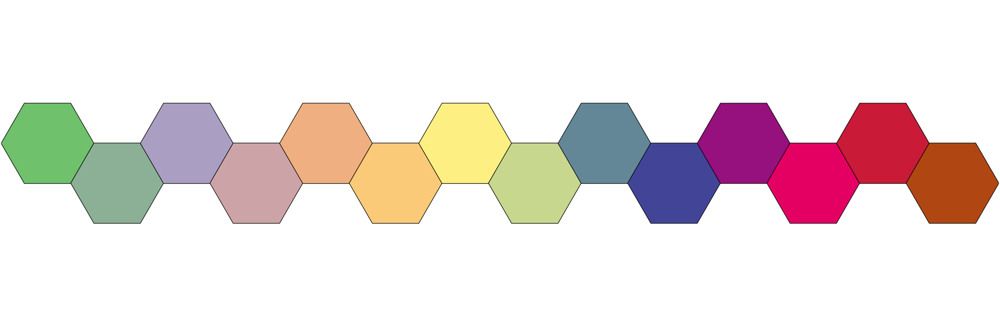

In [72]:
plot_scheme(colorRampPalette(brewer.pal(7, "Dark2"))(14))
plot_scheme(colorRampPalette(brewer.pal(8, "Set1"))(14))
plot_scheme(colorRampPalette(brewer.pal(7, "Set2"))(14))
plot_scheme(colorRampPalette(brewer.pal(12, "Set3"))(14))
plot_scheme(colorRampPalette(brewer.pal(8, "Pastel1"))(14))
plot_scheme(colorRampPalette(brewer.pal(7, "Pastel2"))(14))
plot_scheme(colorRampPalette(brewer.pal(12, "Paired"))(14))
plot_scheme(colorRampPalette(brewer.pal(7, "Accent"))(14))

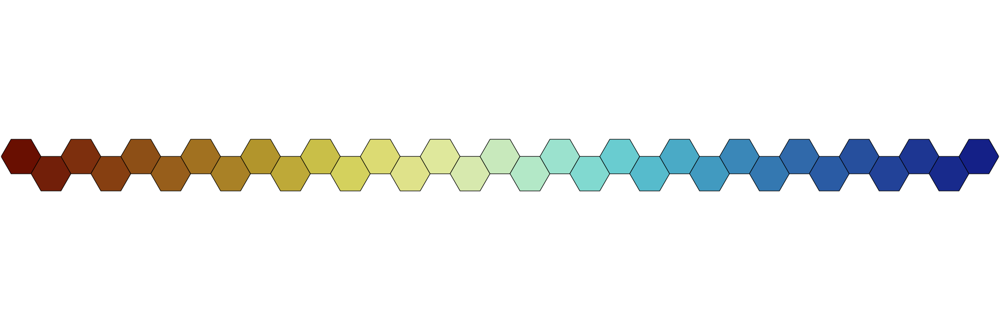

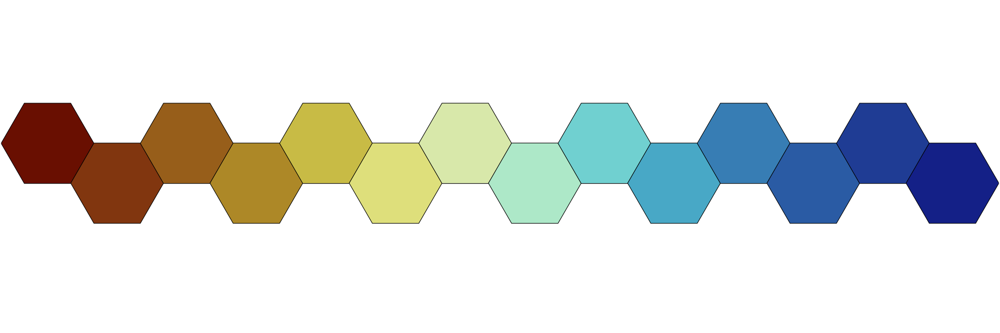

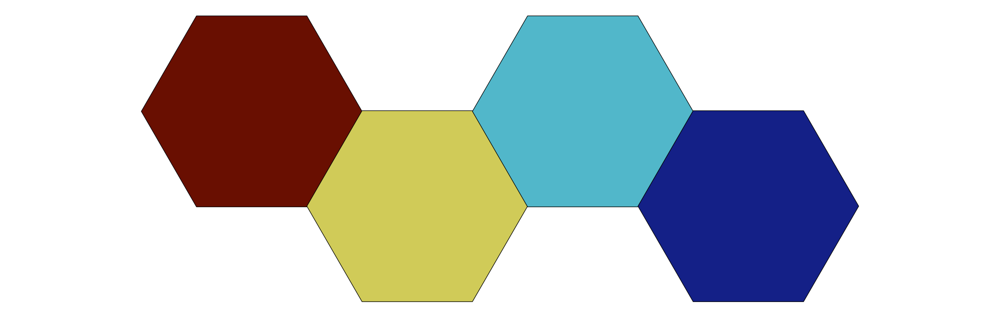

In [74]:

plot_scheme(colour("roma", force = TRUE)(4))

